#1. Using All Features

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix
print("Correlation Matrix")
imputed_df.corr()

Correlation Matrix


,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,CN5,...,Juxtacortical,MRI spinal lesions,Pathological CSF,Increased protein,Pleocytosis,OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
Sex,1.000000e+00,0.016061,-0.124726,-0.186682,-0.143824,0.013304,0.113312,0.091287,0.116754,0.153485,...,-0.124258,0.117442,0.256159,0.278291,0.166620,-0.063964,0.117360,-0.043531,-0.011385,0.149906
Age,1.606093e-02,1.000000,-0.018888,0.040808,0.069197,0.132232,0.028693,0.071353,-0.013823,0.148812,...,0.194098,-0.224160,0.043598,0.308322,0.055476,-0.115866,0.246406,0.229738,0.134672,-0.068102
Fatigue,-1.247262e-01,-0.018888,1.000000,0.239192,0.033463,0.061810,0.028266,-0.079701,-0.086645,0.095718,...,0.254364,-0.241124,-0.029798,-0.111382,-0.068132,-0.039067,-0.030295,0.031995,0.044666,-0.093820
General weakness,-1.866822e-01,0.040808,0.239192,1.000000,0.084867,-0.091215,-0.034265,-0.130136,-0.077672,0.019350,...,0.172669,-0.204313,-0.002075,0.061167,-0.045524,0.022591,-0.085118,-0.204259,0.027302,0.001454
Pain,-1.438243e-01,0.069197,0.033463,0.084867,1.000000,-0.008537,-0.021425,-0.074736,-0.155520,0.167866,...,0.062533,-0.139975,-0.040157,0.134558,-0.038100,-0.025400,0.072157,-0.005035,-0.178989,-0.139549
Focal symptoms,1.330380e-02,0.132232,0.061810,-0.091215,-0.008537,1.000000,0.218173,0.014574,0.108729,0.036171,...,-0.133988,0.101753,0.037959,0.019003,0.011279,0.087697,-0.040427,0.220444,0.203431,0.073790
Cranial Nerve Symptoms,1.133118e-01,0.028693,0.028266,-0.034265,-0.021425,0.218173,1.000000,0.349812,0.208787,0.224059,...,0.086896,-0.109319,0.067680,0.061416,0.172958,-0.024822,-0.170976,0.137961,0.049238,0.061327
CN3,9.128709e-02,0.071353,-0.079701,-0.130136,-0.074736,0.014574,0.349812,1.000000,0.596853,-0.096077,...,0.126301,0.061742,-0.056823,0.095822,0.011825,0.038583,0.016986,0.003610,-0.010968,0.072332
CN4,1.167536e-01,-0.013823,-0.086645,-0.077672,-0.155520,0.108729,0.208787,0.596853,1.000000,-0.057344,...,0.013543,0.088680,-0.225631,-0.003715,-0.129000,-0.162587,-0.149552,-0.077386,0.057650,-0.102512
CN5,1.534852e-01,0.148812,0.095718,0.019350,0.167866,0.036171,0.224059,-0.096077,-0.057344,1.000000,...,-0.035239,0.125520,0.079393,0.082367,0.093909,-0.009715,-0.065336,0.016948,-0.030433,0.075129


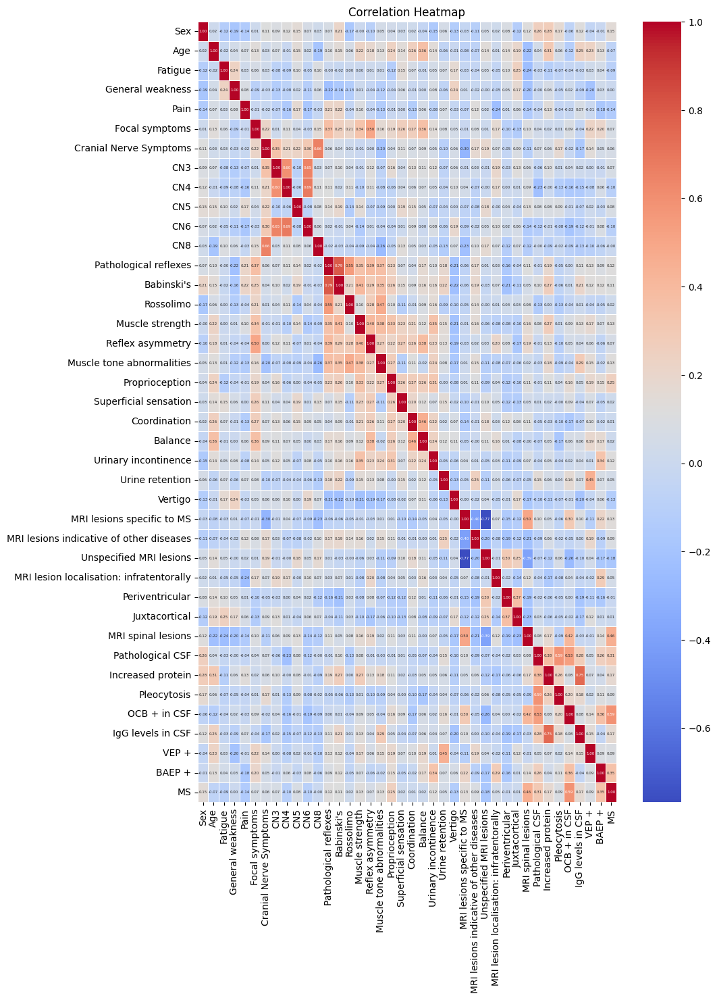

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = imputed_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 4})
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Visualise pairwise correlation as Seaborn plots
import seaborn as sns
sns.pairplot(imputed_df)

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

Features with multicollinearity (absolute correlation coefficient > 0.7):
Pathological reflexes - Babinski's
MRI lesions specific to MS - Unspecified MRI lesions
Increased protein - IgG levels in CSF


Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df.drop('MS', axis=1)
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 39)
(138,)


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


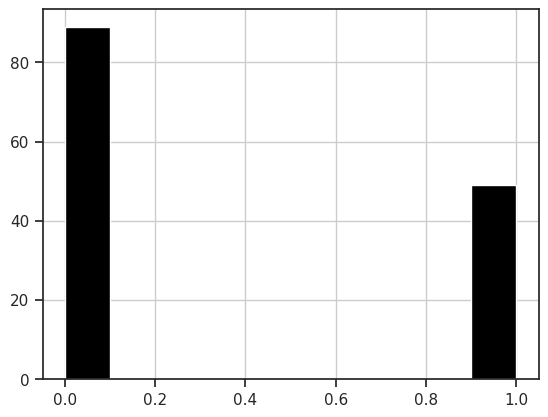

The baseline accuracy is: 0.644927536231884


In [ ]:
#Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

#Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist()
plt.show()

#Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy = 'most_frequent')
clf.fit(x, y)
baseline_accuracy=clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)

##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 39)
x_test: (28, 39)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
#Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for SVM Classifier
svm_param_grid = {
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],
    'gamma': ['scale', 'auto'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of SVM model
    svm = SVC(random_state=1)

    # Create an instance of GridSearchCV for SVM Classifier
    svm_cv = GridSearchCV(svm, svm_param_grid, cv=svm_skfold)

    # Fit GridSearchCV on the training fold
    svm_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_svm_model = svm_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", svm_cv.best_params_)
    print("F1 Score:", svm_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_svm_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_svm_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'C': 1.0, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.884967320261438
Best Parameters: {'C': 0.5, 'class_weight': None, 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.8869281045751635
Best Parameters: {'C': 5.0, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.7836601307189544
Best Parameters: {'C': 5.0, 'class_weight': None, 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.7738562091503267
Best Parameters: {'C': 0.1, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.8071895424836601


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.936681954202446
Standard Deviation of Train F1 Score: 0.06790804744741052
Average Validation F1 Score: 0.7644257703081232
Standard Deviation of Validation F1 Score: 0.12245642760605654


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = svm_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = svm_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.89      0.89      0.89        71
         1.0       0.79      0.79      0.79        39

    accuracy                           0.85       110
   macro avg       0.84      0.84      0.84       110
weighted avg       0.85      0.85      0.85       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.93      0.72      0.81        18
         1.0       0.64      0.90      0.75        10

    accuracy                           0.79        28
   macro avg       0.79      0.81      0.78        28
weighted avg       0.83      0.79      0.79        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

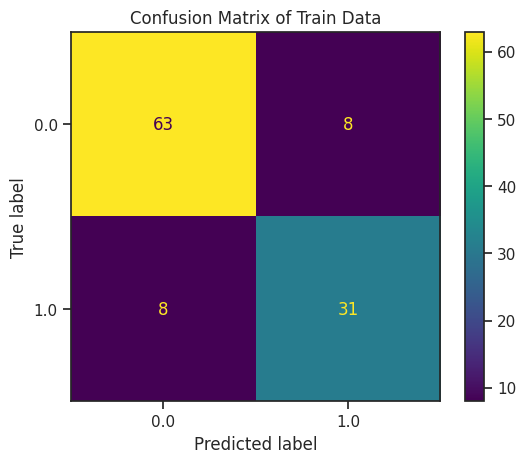

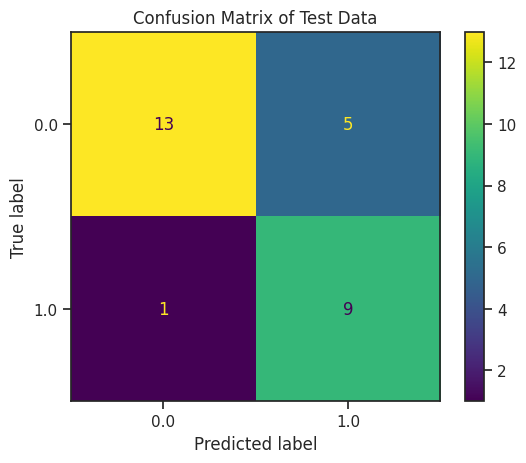

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

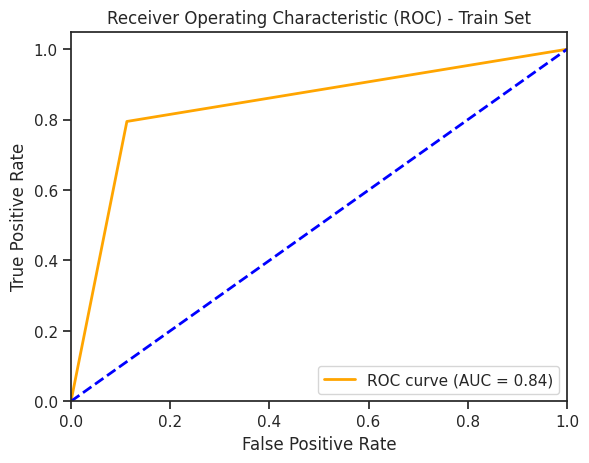

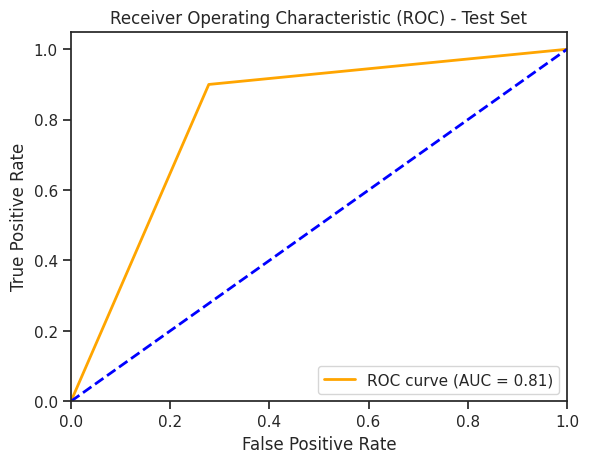

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

Sex: 0.21443
Age: 0.00300
Fatigue: -0.20241
General weakness: 0.12258
Pain: -0.06877
Focal symptoms: 0.04216
Cranial Nerve Symptoms: 0.36948
CN3: 0.04117
CN4: -0.07150
CN5: 0.14057
CN6: -0.01257
CN8: 0.25460
Pathological reflexes: -0.06695
Babinski's: 0.02049
Rossolimo: -0.17788
Muscle strength: 0.28468
Reflex asymmetry: -0.03144
Muscle tone abnormalities: 0.15993
Proprioception: 0.20270
Superficial sensation: 0.17834
Coordination: -0.04013
Balance: -0.27298
Urinary incontinence: 0.10656
Urine retention: -0.15738
Vertigo: -0.14743
MRI lesions specific to MS: -0.14356
MRI lesions indicative of other diseases: 0.30818
Unspecified MRI lesions: -0.12882
MRI infratentorial lesions: 0.01493
Periventricular: -0.06631
Juxtacortical: -0.10476
MRI spinal lesions: 0.68120
Pathological CSF: 0.27013
Increased protein: -0.33387
Pleocytosis: -0.09731
OCB + in CSF: 0.75652
IgG levels in CSF: 0.00785
VEP +: -0.02712
BAEP +: 0.49159


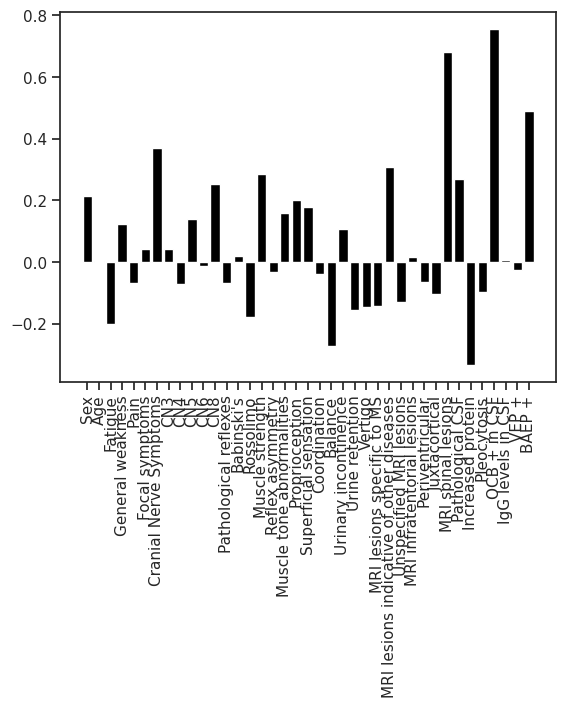

In [ ]:
importance = best_model.coef_[0]

# Summarize feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()



#2. Using All Except Multicollinear Features

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Drop features with multicollinearity that also have a low correlation with target variable

In [ ]:
columns_to_drop = ["Babinski's", "Unspecified MRI lesions", "Increased protein"]
df.drop(columns=columns_to_drop, inplace=True)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial sensation                       float64
Coordination

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix
print("Correlation Matrix")
imputed_df.corr()

Correlation Matrix


,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,CN5,...,Periventricular,Juxtacortical,MRI spinal lesions,Pathological CSF,Pleocytosis,OGB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
Sex,1.000000e+00,0.016061,-0.124726,-0.186682,-0.143824,0.013304,0.113312,0.091287,0.116754,0.153485,...,0.094542,-0.105958,0.125444,0.243080,0.178173,-0.048138,0.005579,-0.057869,-0.004314,0.149906
Age,1.606093e-02,1.000000,-0.018888,0.040808,0.069197,0.132232,0.028693,0.071353,-0.013823,0.148812,...,0.139244,0.195399,0.085186,0.031809,0.037781,-0.149899,0.240232,0.242817,0.139332,-0.068102
Fatigue,-1.247262e-01,-0.018888,1.000000,0.239192,0.033463,0.061810,0.028266,-0.079701,-0.086645,0.095718,...,0.102698,0.238302,-0.111317,-0.028414,-0.060553,-0.034315,0.023302,0.139524,0.023777,-0.093820
General weakness,-1.866822e-01,0.040808,0.239192,1.000000,0.084867,-0.091215,-0.034265,-0.130136,-0.077672,0.019350,...,0.048775,0.143303,-0.187123,0.001092,-0.034323,0.017347,-0.055048,-0.154771,-0.018543,0.001454
Pain,-1.438243e-01,0.069197,0.033463,0.084867,1.000000,-0.008537,-0.021425,-0.074736,-0.155520,0.167866,...,-0.004080,0.036253,-0.201428,-0.036298,-0.076684,-0.068398,0.122203,-0.057584,-0.133100,-0.139549
Focal symptoms,1.330380e-02,0.132232,0.061810,-0.091215,-0.008537,1.000000,0.218173,0.014574,0.108729,0.036171,...,-0.092496,-0.095371,0.086989,0.044754,-0.005424,0.066171,0.072911,0.265760,0.195272,0.073790
Cranial Nerve Symptoms,1.133118e-01,0.028693,0.028266,-0.034265,-0.021425,0.218173,1.000000,0.349812,0.208787,0.224059,...,-0.052459,0.056558,-0.055059,0.067118,0.149994,-0.077656,-0.041499,0.132557,-0.019921,0.061327
CN3,9.128709e-02,0.071353,-0.079701,-0.130136,-0.074736,0.014574,0.349812,1.000000,0.596853,-0.096077,...,-0.031465,0.106806,0.146362,-0.055679,-0.011778,0.040993,0.108632,0.058525,-0.062796,0.072332
CN4,1.167536e-01,-0.013823,-0.086645,-0.077672,-0.155520,0.108729,0.208787,0.596853,1.000000,-0.057344,...,0.000548,0.003074,0.208747,-0.228508,-0.121118,-0.149523,-0.123336,-0.082771,0.050026,-0.102512
CN5,1.534852e-01,0.148812,0.095718,0.019350,0.167866,0.036171,0.224059,-0.096077,-0.057344,1.000000,...,0.037922,-0.045536,0.165067,0.077212,0.059120,-0.019240,-0.026449,0.063097,-0.017645,0.075129


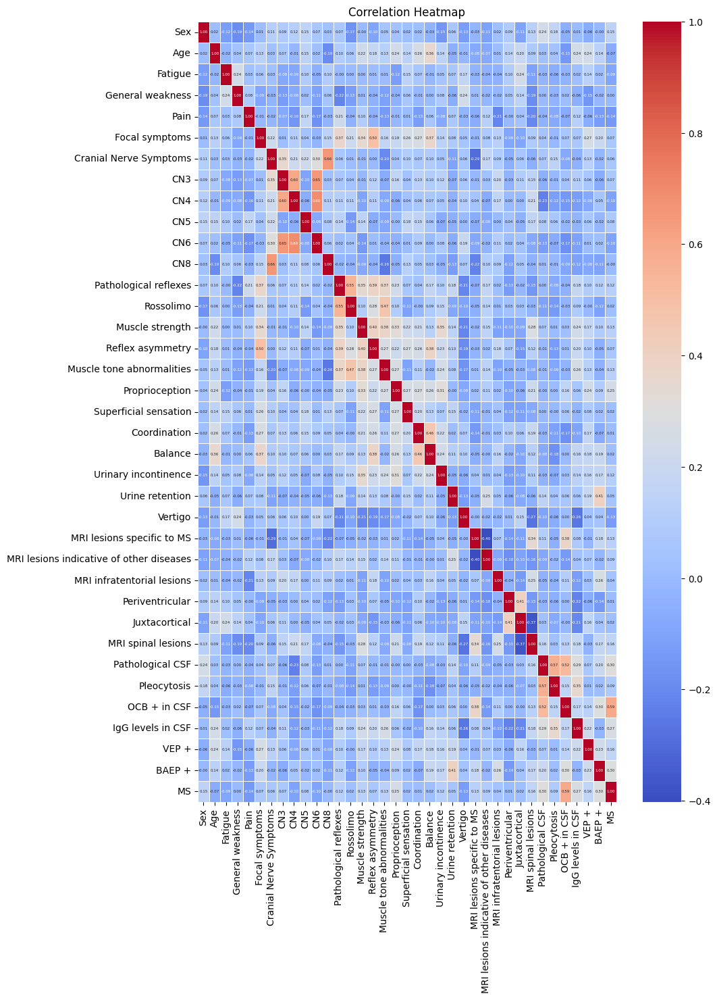

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = imputed_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 4})
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Visualise pairwise correlation as Seaborn plots
import seaborn as sns
sns.pairplot(imputed_df)

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df.drop('MS', axis=1)
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 36)
(138,)


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


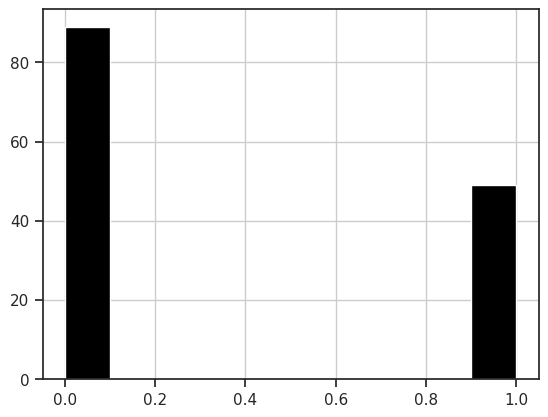

The baseline accuracy is: 0.644927536231884


In [ ]:
#Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

#Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist()
plt.show()

#Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy = 'most_frequent')
clf.fit(x, y)
baseline_accuracy=clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)

##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 36)
x_test: (28, 36)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
#Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for SVM Classifier
svm_param_grid = {
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],
    'gamma': ['scale', 'auto'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of SVM model
    svm = SVC(random_state=1)

    # Create an instance of GridSearchCV for SVM Classifier
    svm_cv = GridSearchCV(svm, svm_param_grid, cv=svm_skfold)

    # Fit GridSearchCV on the training fold
    svm_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_svm_model = svm_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", svm_cv.best_params_)
    print("F1 Score:", svm_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_svm_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_svm_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'C': 0.5, 'class_weight': None, 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.8281045751633986
Best Parameters: {'C': 0.1, 'class_weight': None, 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.7503267973856209
Best Parameters: {'C': 0.1, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.7732026143790849
Best Parameters: {'C': 0.1, 'class_weight': None, 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.7176470588235293
Best Parameters: {'C': 0.1, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.7516339869281046


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.8005654997629366
Standard Deviation of Train F1 Score: 0.06265412339487203
Average Validation F1 Score: 0.631480284421461
Standard Deviation of Validation F1 Score: 0.1075596357646818


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = svm_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = svm_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.88      0.83      0.86        71
         1.0       0.72      0.79      0.76        39

    accuracy                           0.82       110
   macro avg       0.80      0.81      0.81       110
weighted avg       0.82      0.82      0.82       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.80      0.67      0.73        18
         1.0       0.54      0.70      0.61        10

    accuracy                           0.68        28
   macro avg       0.67      0.68      0.67        28
weighted avg       0.71      0.68      0.68        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

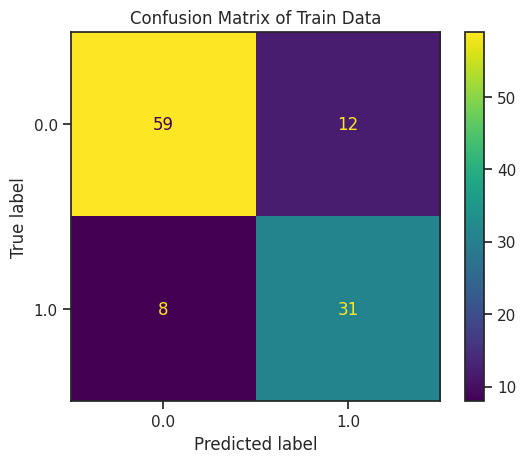

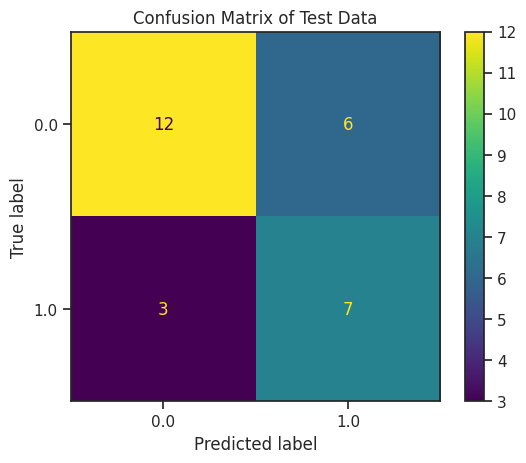

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

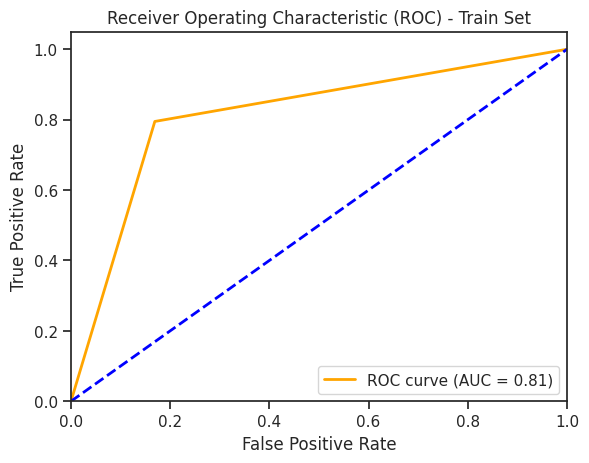

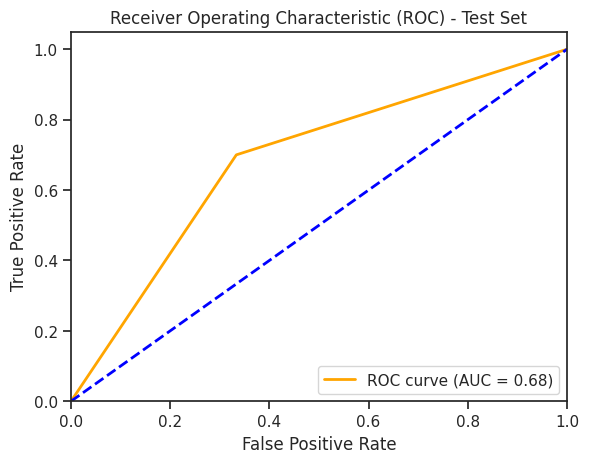

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

Sex: 0.16336
Age: -0.01499
Fatigue: -0.24635
General weakness: 0.17906
Pain: -0.11041
Focal symptoms: -0.04246
Cranial Nerve Symptoms: 0.40283
CN3: 0.06211
CN4: -0.01964
CN5: 0.16363
CN6: -0.05229
CN8: 0.22702
Pathological reflexes: 0.01700
Rossolimo: -0.11106
Muscle strength: 0.29634
Reflex asymmetry: -0.08189
Muscle tone abnormalities: 0.13646
Proprioception: 0.29216
Superficial sensation: 0.14455
Coordination: 0.03681
Balance: -0.29567
Urinary incontinence: 0.16810
Urine retention: -0.16313
Vertigo: -0.12849
MRI lesions specific to MS: 0.04086
MRI lesions indicative of other diseases: 0.30975
MRI infratentorial lesions: 0.10964
Periventricular: -0.17790
Juxtacortical: -0.07363
MRI spinal lesions: 0.29827
Pathological CSF: 0.13019
Pleocytosis: -0.21860
OCB + in CSF: 0.93951
IgG levels in CSF: 0.00748
VEP +: 0.22076
BAEP +: 0.45142


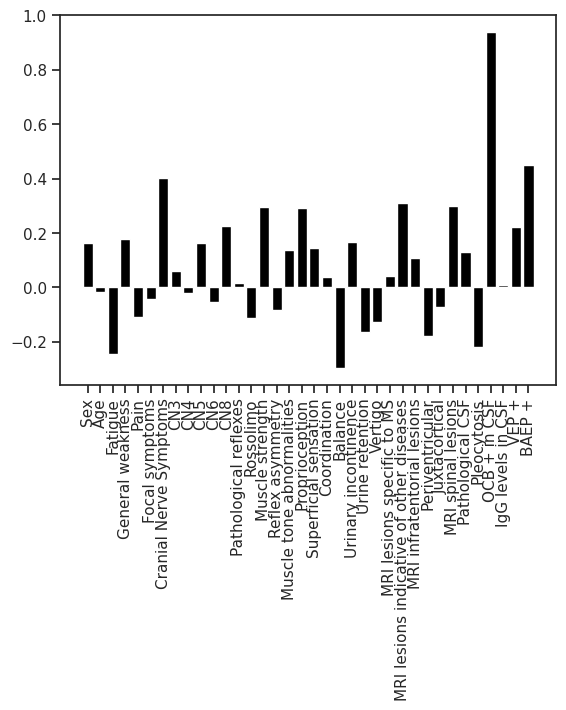

In [ ]:
importance = best_model.coef_[0]

# Summarize feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()



#3. Using only important features from feature selection

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[['Sex', 'General weakness', 'Cranial Nerve Symptoms', 'MRI lesions indicative of other diseases', 'Periventricular', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +', 'Pathological reflexes', 'Muscle tone abnormalities', 'Proprioception', ]]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 11)
(138,)


Visualising Relationship between Target Variable and Each Feature in X

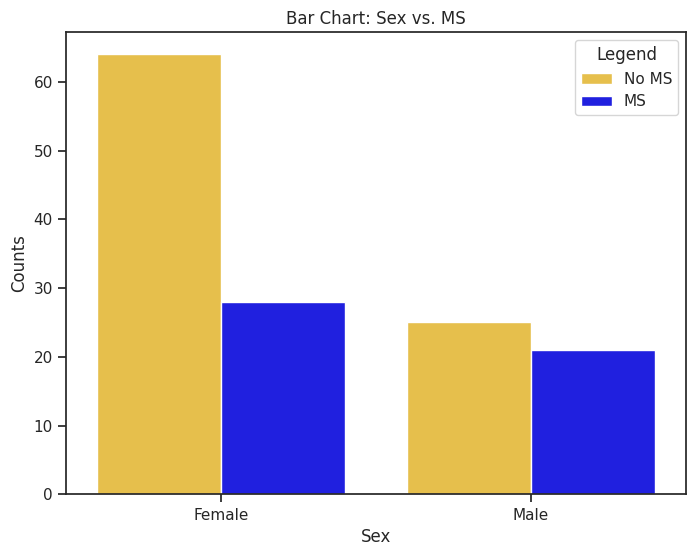

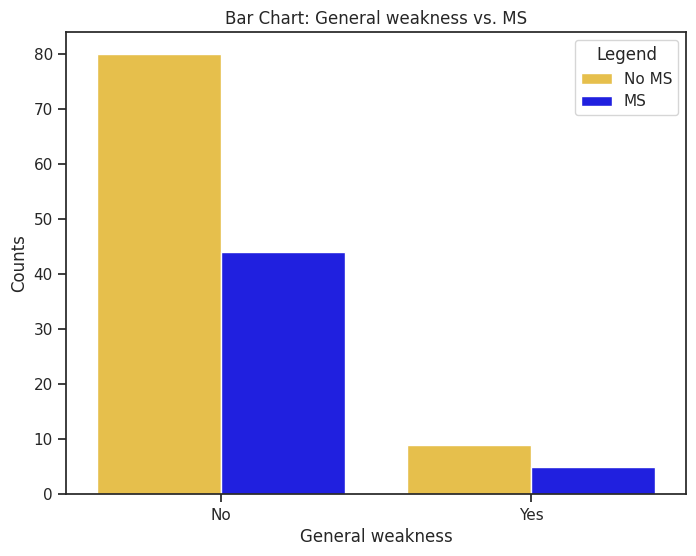

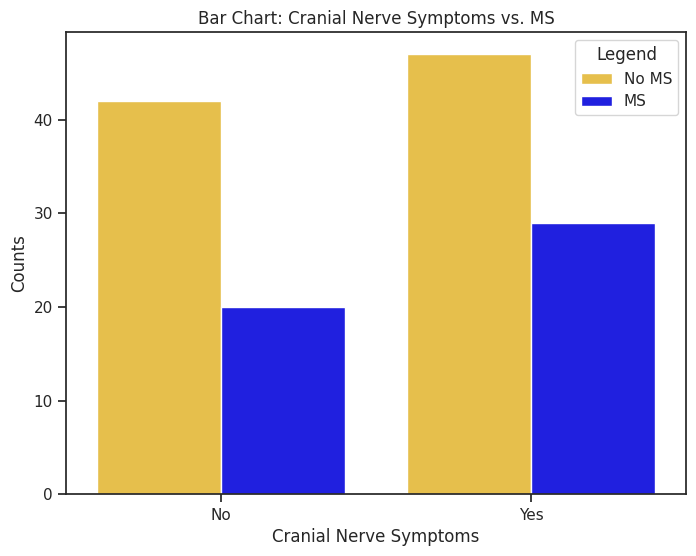

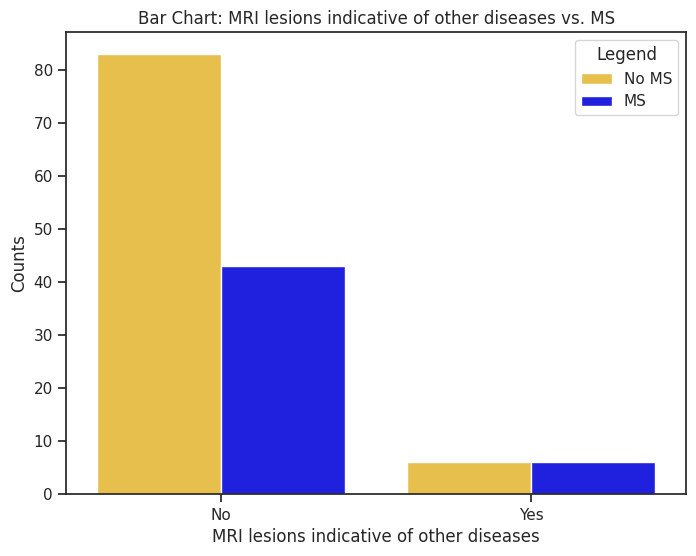

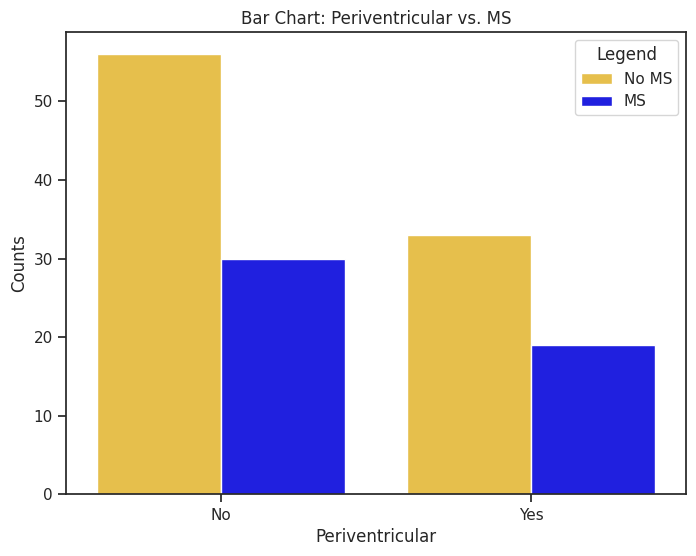

...

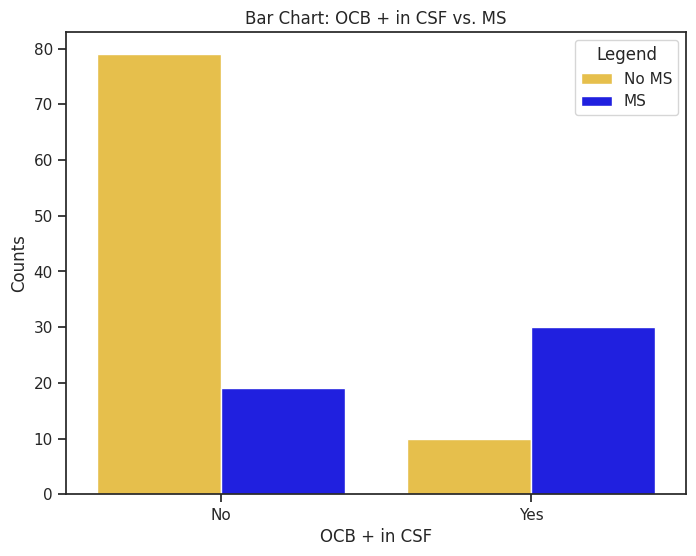

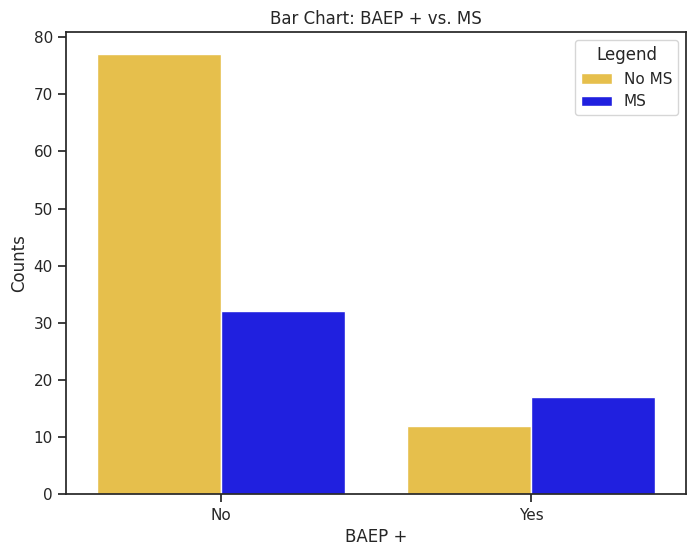

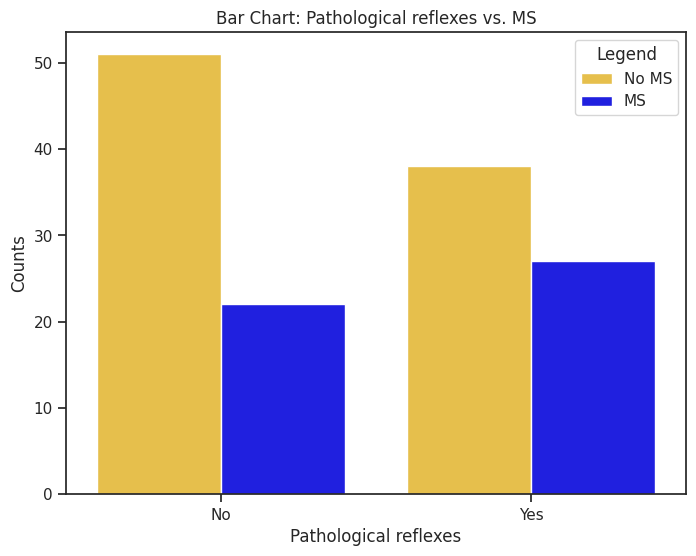

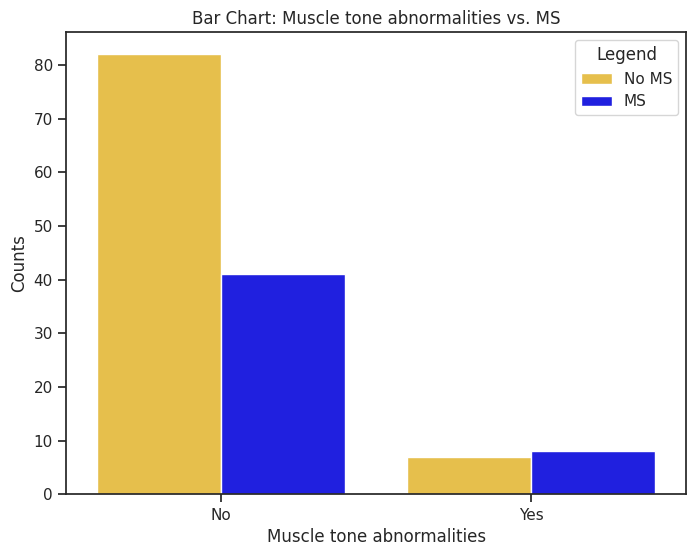

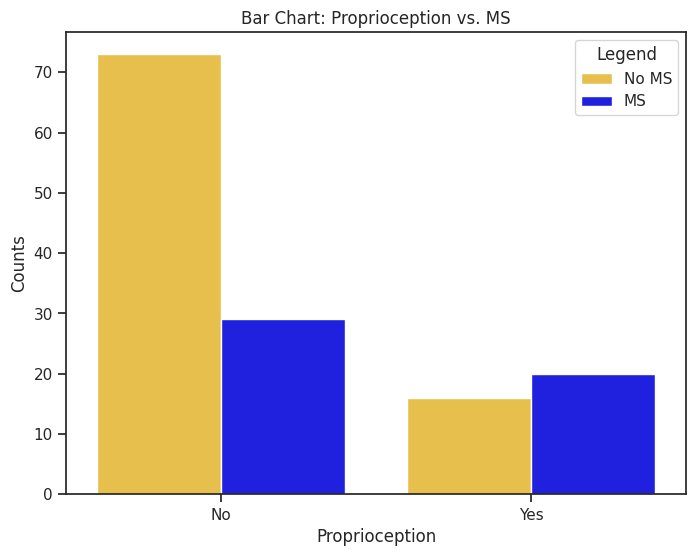

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette([(1.0, 0.8, 0.2), "blue"])

# Plot Bar chart: Sex vs. MS
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='Sex', hue='MS', data=imputed_df)
ax.set_ylabel("Counts")
ax.set_xlabel("Sex")
ax.set_xticklabels(["Female", "Male"])
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()

# Plot Bar chart: General weakness vs. MS
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='General weakness', hue='MS', data=imputed_df)
ax.set_ylabel("Counts")
ax.set_xlabel("General weakness")
ax.set_xticklabels(["No", "Yes"])
plt.title("Bar Chart: General weakness vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()

# Plot Bar chart: Cranial Nerve Symptoms vs. MS
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='Cranial Nerve Symptoms', hue='MS', data=imputed_df)
ax.set_ylabel("Counts")
ax.set_xlabel("Cranial Nerve Symptoms")
ax.set_xticklabels(["No", "Yes"])
plt.title("Bar Chart: Cranial Nerve Symptoms vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return 0.0

# Filter the data and convert the variables to binary values
filtered_df = imputed_df.copy()
filtered_df['MRI lesions indicative of other diseases'] = filtered_df['MRI lesions indicative of other diseases'].apply(convert_to_binary)
filtered_df['Periventricular'] = filtered_df['Periventricular'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)
filtered_df['Pathological reflexes'] = filtered_df['Pathological reflexes'].apply(convert_to_binary)
filtered_df['Muscle tone abnormalities'] = filtered_df['Muscle tone abnormalities'].apply(convert_to_binary)
filtered_df['Proprioception'] = filtered_df['Proprioception'].apply(convert_to_binary)

# Plot Bar chart for each variable
variables = ['MRI lesions indicative of other diseases', 'Periventricular', 'MRI spinal lesions',
             'OCB + in CSF', 'BAEP +', 'Pathological reflexes', 'Muscle tone abnormalities', 'Proprioception']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,Sex,General weakness,Cranial Nerve Symptoms,MRI lesions indicative of other diseases,Periventricular,MRI spinal lesions,OCB + in CSF,BAEP +,Pathological reflexes,Muscle tone abnormalities,Proprioception,MS
Sex,1.000000,-0.186682,0.113312,-0.110560,0.083652,0.117442,-0.063964,-0.011385,0.071856,0.049386,0.037235,0.149906
General weakness,-0.186682,1.000000,-0.034265,-0.019195,0.054778,-0.204313,0.022591,0.027302,-0.220900,-0.117340,-0.036196,0.001454
Cranial Nerve Symptoms,0.113312,-0.034265,1.000000,0.173181,-0.045527,-0.109319,-0.024822,0.049238,0.064291,-0.199424,0.040381,0.061327
MRI lesions indicative of other diseases,-0.110560,-0.019195,0.173181,1.000000,-0.194648,-0.208989,-0.046605,-0.094885,0.174661,0.145874,0.107943,0.092012
Periventricular,0.083652,0.054778,-0.045527,-0.194648,1.000000,-0.187674,0.001096,-0.161956,-0.160738,-0.074033,-0.122544,-0.008120
MRI spinal lesions,0.117442,-0.204313,-0.109319,-0.208989,-0.187674,1.000000,0.416571,0.135498,0.111375,0.022632,0.108183,0.457196
OCB + in CSF,-0.063964,0.022591,-0.024822,-0.046605,0.001096,0.416571,1.000000,0.360770,0.002650,-0.042284,0.162010,0.589130
BAEP +,-0.011385,0.027302,0.049238,-0.094885,-0.161956,0.135498,0.360770,1.000000,0.086663,-0.023446,0.154389,0.349223
Pathological reflexes,0.071856,-0.220900,0.064291,0.174661,-0.160738,0.111375,0.002650,0.086663,1.000000,0.370082,0.234687,0.118929
Muscle tone abnormalities,0.049386,-0.117340,-0.199424,0.145874,-0.074033,0.022632,-0.042284,-0.023446,0.370082,1.000000,0.269365,0.130087


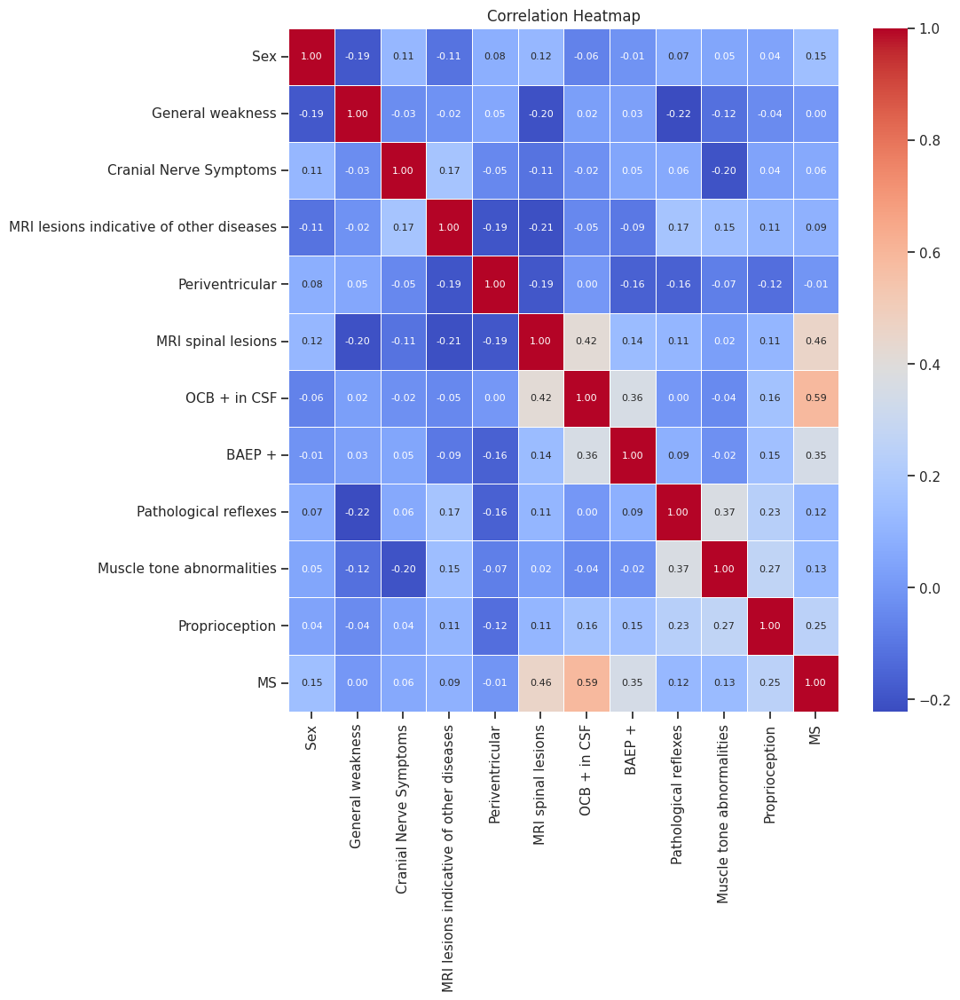

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

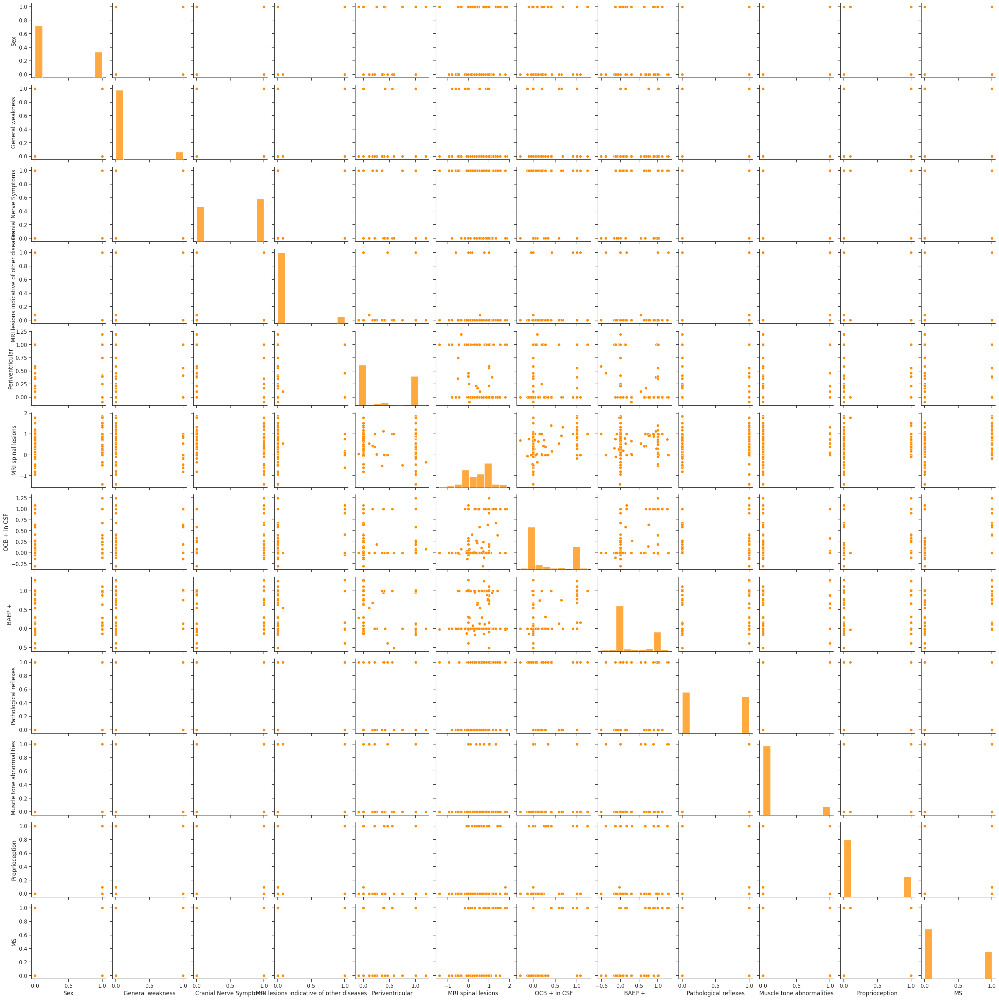

In [ ]:
# Import libraries
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Define custom palette with bright orange
custom_palette = ["#FF8C00"]

# Set color palette to custom palette
sns.set_palette(custom_palette)

# Visualize plots
sns.pairplot(data)



In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


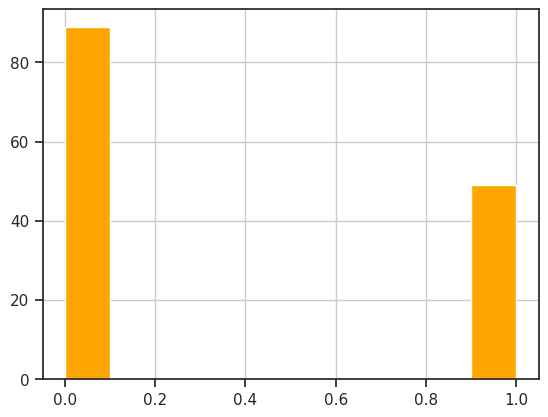

The baseline accuracy is: 0.644927536231884


In [ ]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist(color=['orange'])
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 11)
x_test: (28, 11)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
#Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for SVM Classifier
svm_param_grid = {
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],
    'gamma': ['scale', 'auto'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of SVM model
    svm = SVC(random_state=1)

    # Create an instance of GridSearchCV for SVM Classifier
    svm_cv = GridSearchCV(svm, svm_param_grid, cv=svm_skfold)

    # Fit GridSearchCV on the training fold
    svm_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_svm_model = svm_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", svm_cv.best_params_)
    print("F1 Score:", svm_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_svm_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_svm_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'C': 1.0, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.8960784313725491
Best Parameters: {'C': 1.0, 'class_weight': None, 'gamma': 'auto', 'kernel': 'rbf', 'random_state': None}
F1 Score: 0.8411764705882353
Best Parameters: {'C': 0.1, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'linear', 'random_state': None}
F1 Score: 0.8300653594771242
Best Parameters: {'C': 0.5, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf', 'random_state': None}
F1 Score: 0.8176470588235294
Best Parameters: {'C': 10.0, 'class_weight': None, 'gamma': 'auto', 'kernel': 'sigmoid', 'random_state': None}
F1 Score: 0.8405228758169934


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.8068275986308773
Standard Deviation of Train F1 Score: 0.04384165488138766
Average Validation F1 Score: 0.7118526897938662
Standard Deviation of Validation F1 Score: 0.13748143128740226


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = svm_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = svm_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.87      0.92      0.89        71
         1.0       0.83      0.74      0.78        39

    accuracy                           0.85       110
   macro avg       0.85      0.83      0.84       110
weighted avg       0.85      0.85      0.85       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.88      0.78      0.82        18
         1.0       0.67      0.80      0.73        10

    accuracy                           0.79        28
   macro avg       0.77      0.79      0.78        28
weighted avg       0.80      0.79      0.79        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

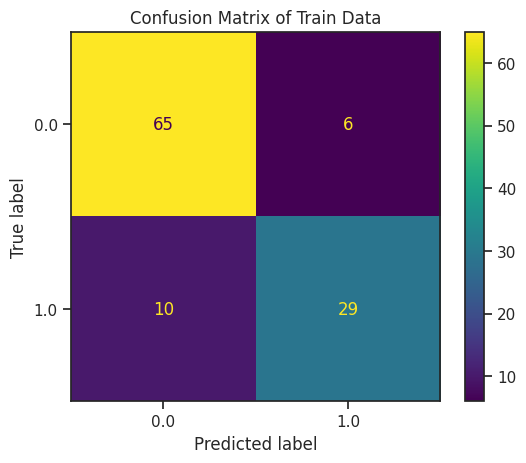

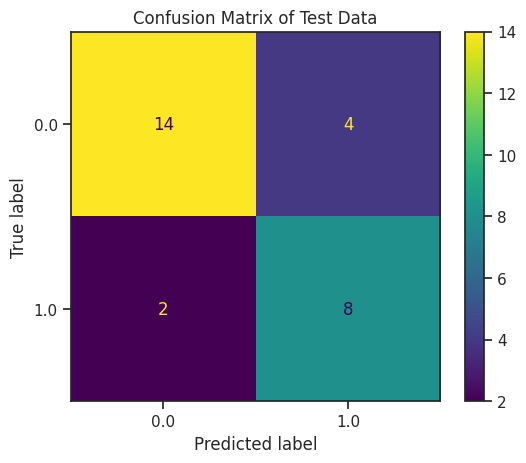

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

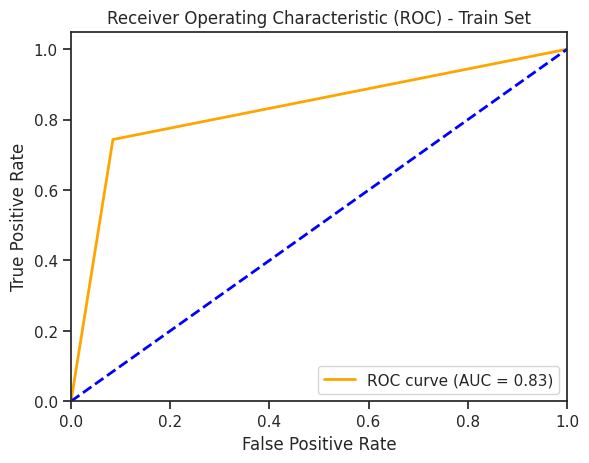

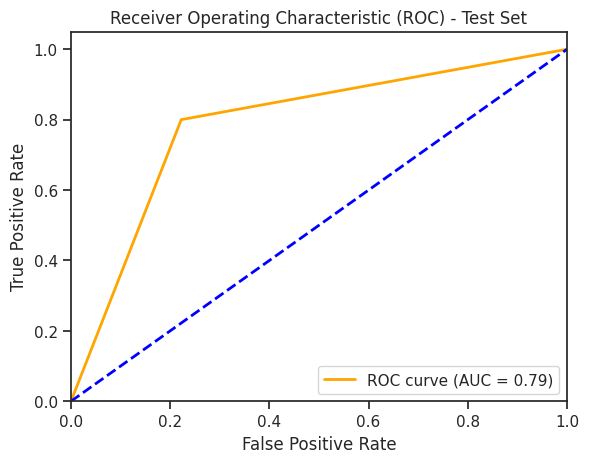

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculating Feature Importances

In [ ]:
importance = best_model.coef_[0]

# Summarize feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Define colors for each bar
colors = ['blue' if v >= 0 else 'orange' for v in importance]

# Plot feature importances
plt.bar(feature_names, importance, color=colors)
plt.xticks(rotation=90)
plt.show()


AttributeError: ignored

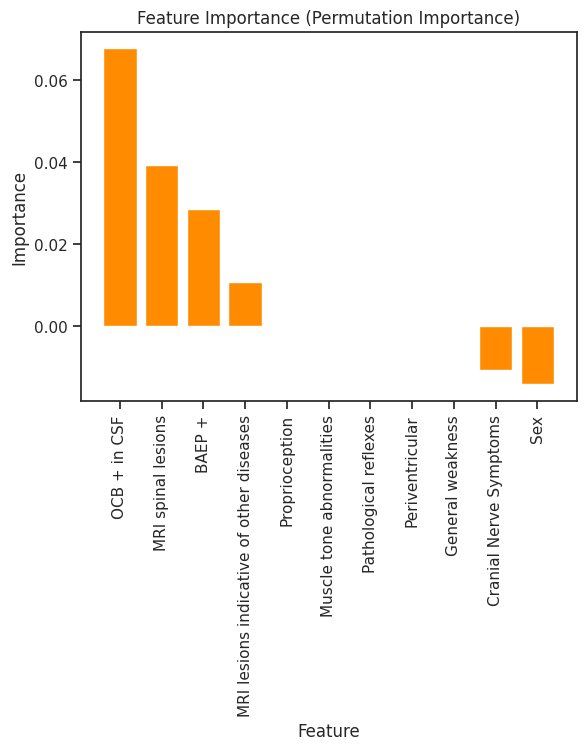

In [ ]:
#Import libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Compute feature importance using permutation importance
perm_importance = permutation_importance(best_model, x_test, y_test, n_repeats=10, random_state=42)

# Get feature names
feature_names = list(x_train.columns)

# Calculate mean importance scores
mean_importance = perm_importance.importances_mean

# Sort features by importance
sorted_indices = np.argsort(mean_importance)[::-1]
sorted_feature_names = [feature_names[idx] for idx in sorted_indices]
sorted_mean_importance = mean_importance[sorted_indices]

# Plot feature importances
plt.bar(sorted_feature_names, sorted_mean_importance)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance (Permutation Importance)')
plt.show()


#4. Using Only Predictors Identified in the Original Study

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[['Proprioception', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +']]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 4)
(138,)


Visualising Relationship between Target Variable and Each Feature in X

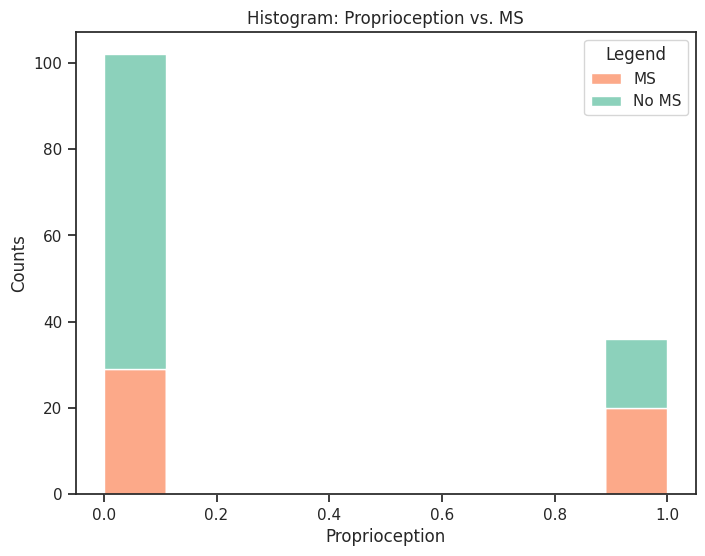

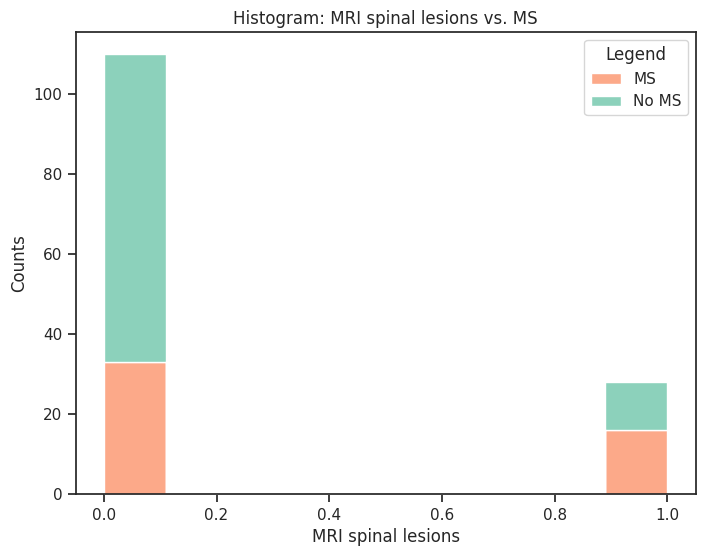

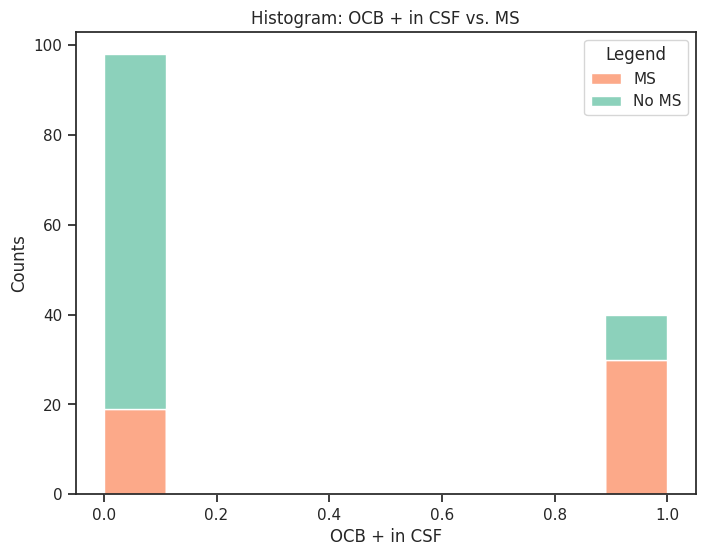

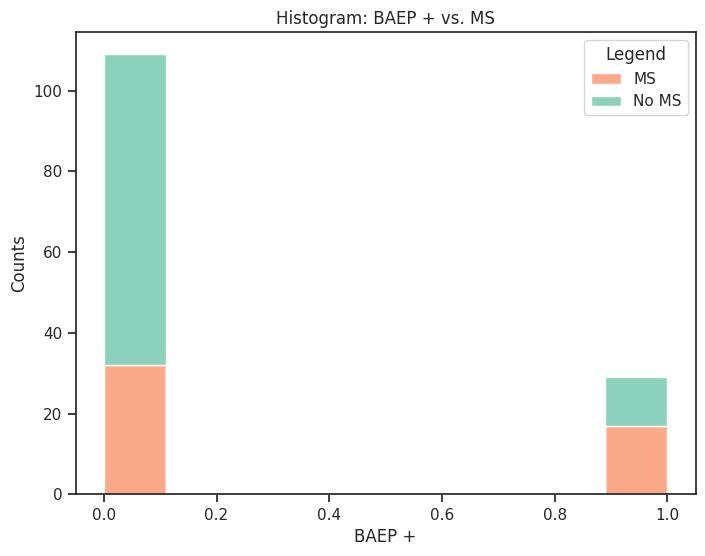

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and palette for plots
sns.set(style="ticks")
sns.set_palette("Set2")

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return 0.0  # Convert any unexpected value to 0.0

# Filter the data and convert the variables to binary values
filtered_df = imputed_df.copy()
filtered_df['Proprioception'] = filtered_df['Proprioception'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Plot Histogram for each variable
variables = ['Proprioception', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +']

for variable in variables:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=filtered_df, x=variable, hue='MS', element="step", multiple="stack")
    plt.xlabel(variable)
    plt.ylabel("Counts")
    plt.title(f"Histogram: {variable} vs. MS")
    plt.legend(title="Legend", labels=["MS", "No MS"])
    plt.show()


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,Proprioception,MRI spinal lesions,OCB + in CSF,BAEP +,MS
Proprioception,1.000000,0.108183,0.162010,0.154389,0.251181
MRI spinal lesions,0.108183,1.000000,0.416571,0.135498,0.457196
OCB + in CSF,0.162010,0.416571,1.000000,0.360770,0.589130
BAEP +,0.154389,0.135498,0.360770,1.000000,0.349223
MS,0.251181,0.457196,0.589130,0.349223,1.000000


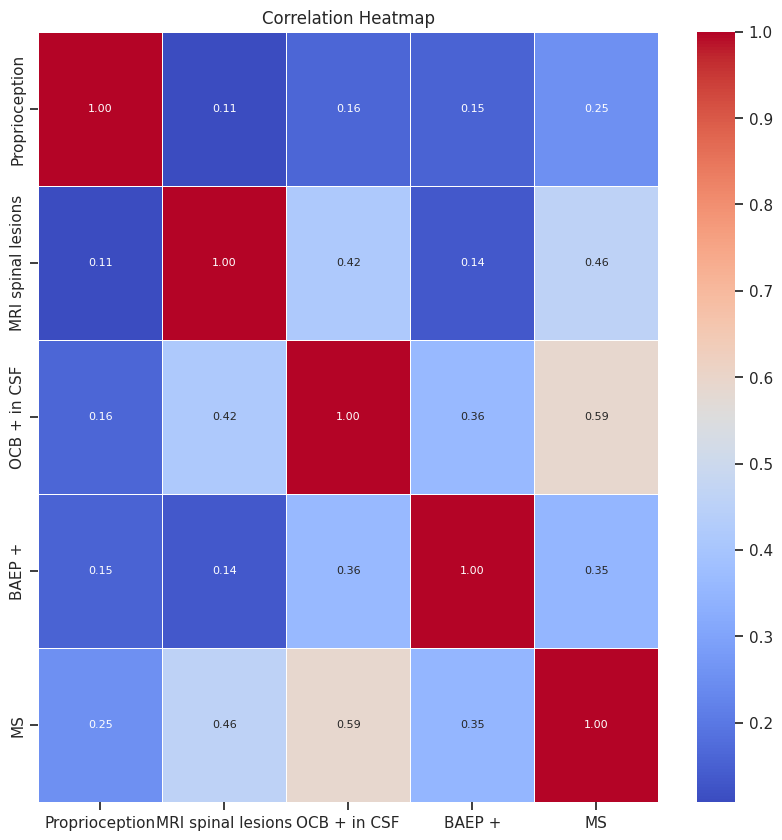

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

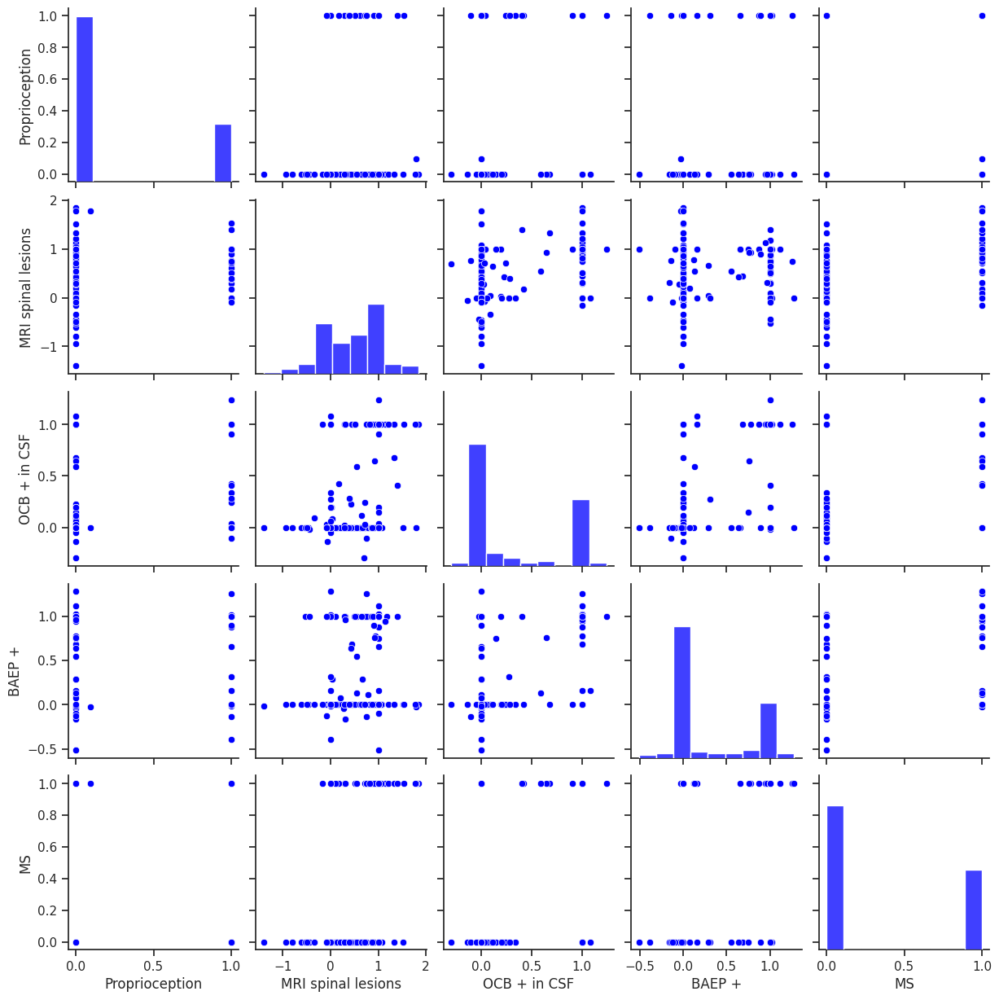

In [ ]:
# Import library
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(data, diag_kws={'color': color}, plot_kws={'color': color})


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


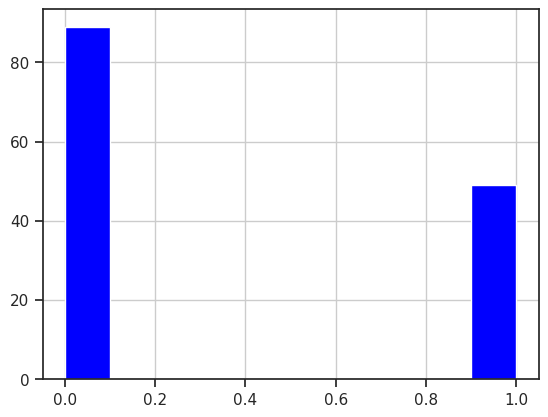

The baseline accuracy is: 0.644927536231884


In [ ]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualize dataset imbalance
import matplotlib.pyplot as plt
y.hist(color=['blue'])
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 4)
x_test: (28, 4)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
#Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for SVM Classifier
svm_param_grid = {
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],
    'gamma': ['scale', 'auto'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of SVM model
    svm = SVC(random_state=1)

    # Create an instance of GridSearchCV for SVM Classifier
    svm_cv = GridSearchCV(svm, svm_param_grid, cv=svm_skfold)

    # Fit GridSearchCV on the training fold
    svm_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_svm_model = svm_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", svm_cv.best_params_)
    print("F1 Score:", svm_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_svm_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_svm_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'C': 0.1, 'class_weight': None, 'gamma': 'scale', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.8738562091503269
Best Parameters: {'C': 0.1, 'class_weight': None, 'gamma': 'scale', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.8424836601307188
Best Parameters: {'C': 0.5, 'class_weight': None, 'gamma': 'auto', 'kernel': 'rbf', 'random_state': None}
F1 Score: 0.8176470588235294
Best Parameters: {'C': 0.5, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf', 'random_state': None}
F1 Score: 0.8183006535947712
Best Parameters: {'C': 0.1, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.8522875816993464


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.7596131414856726
Standard Deviation of Train F1 Score: 0.037246442769523484
Average Validation F1 Score: 0.727047952047952
Standard Deviation of Validation F1 Score: 0.147968042233496


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = svm_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = svm_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.84      0.94      0.89        71
         1.0       0.87      0.67      0.75        39

    accuracy                           0.85       110
   macro avg       0.85      0.81      0.82       110
weighted avg       0.85      0.85      0.84       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.89      0.89      0.89        18
         1.0       0.80      0.80      0.80        10

    accuracy                           0.86        28
   macro avg       0.84      0.84      0.84        28
weighted avg       0.86      0.86      0.86        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

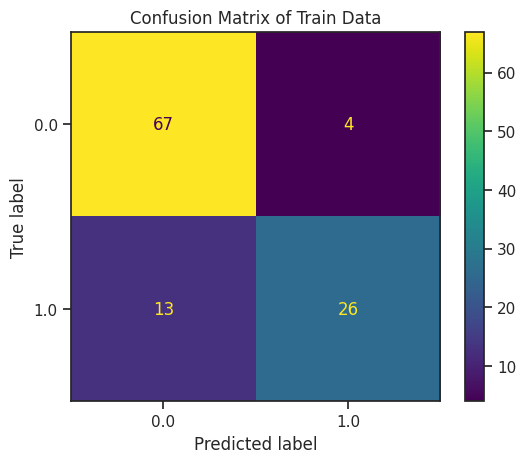

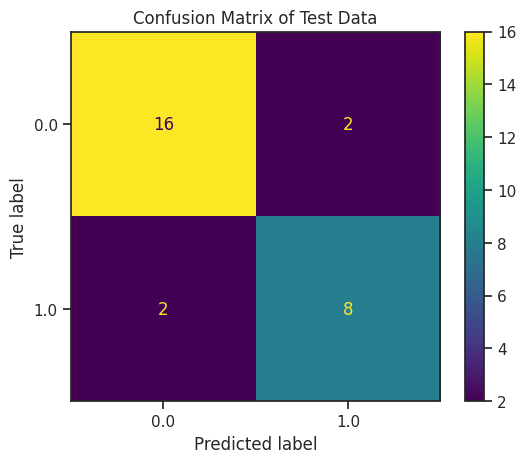

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

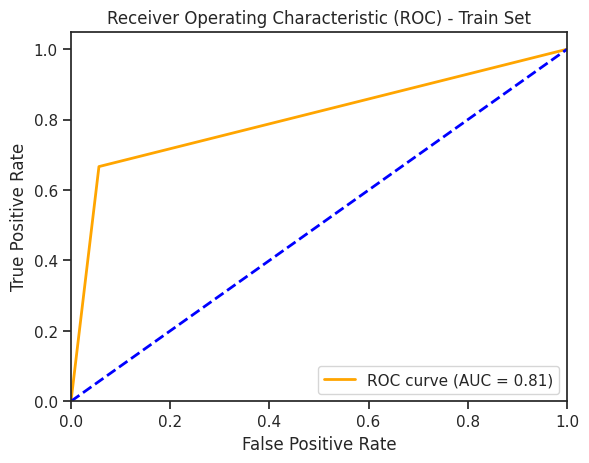

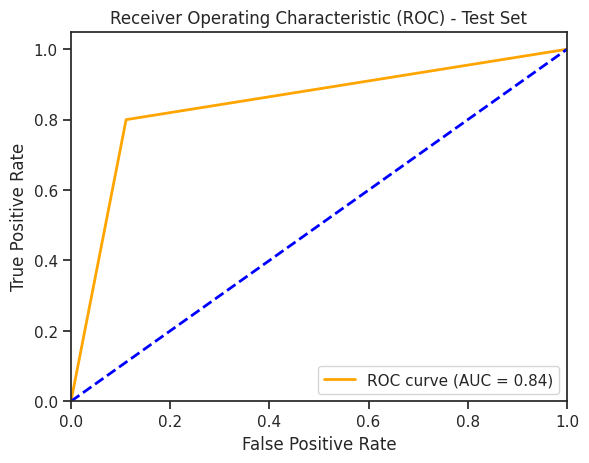

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

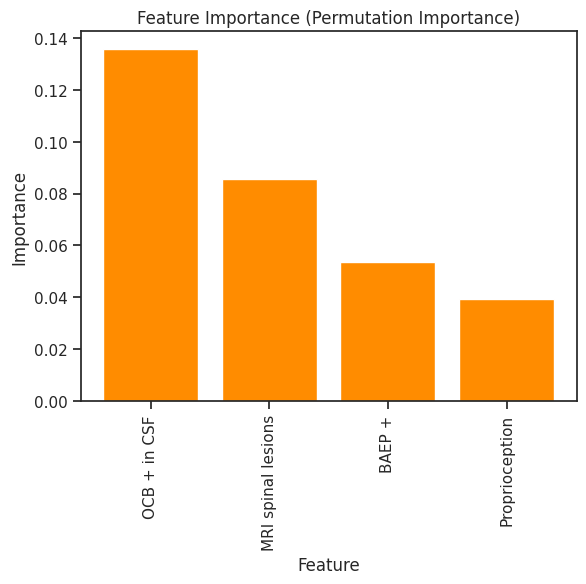

In [ ]:
#Import libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Compute feature importance using permutation importance
perm_importance = permutation_importance(best_model, x_test, y_test, n_repeats=10, random_state=42)

# Get feature names
feature_names = list(x_train.columns)

# Calculate mean importance scores
mean_importance = perm_importance.importances_mean

# Sort features by importance
sorted_indices = np.argsort(mean_importance)[::-1]
sorted_feature_names = [feature_names[idx] for idx in sorted_indices]
sorted_mean_importance = mean_importance[sorted_indices]

# Plot feature importances
plt.bar(sorted_feature_names, sorted_mean_importance)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance (Permutation Importance)')
plt.show()


#5. Testing on Mexican Dataset

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Specify file paths and load them into DataFrames
import pandas as pd
train_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df_train=pd.DataFrame(train_data)
test_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Updated Mexican Research Dataset.xlsx')
df_test=pd.DataFrame(test_data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the datasets and their dimensions

In [ ]:
# Visualise the train dataset
df_train.head(400)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Visualise the test dataset
df_test.head(400)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0.0,0,0,0,1,0,1
1,2,1,61,1.0,1,0,0,1,0,1
2,3,1,22,1.0,0,0,0,0,0,1
3,4,0,41,1.0,1,0,1,0,0,1
4,5,0,34,0.0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
267,268,0,31,0.0,0,0,0,0,0,0
268,269,1,21,1.0,0,0,0,1,0,0
269,270,0,19,0.0,1,0,0,1,0,0
270,271,0,32,1.0,1,0,1,0,1,0


In [ ]:
# Number of observations and features in both datasets
print("The train dataset dimensions are: ")
print(df_train.shape)
print("The test dataset dimensions are: ")
print(df_test.shape)

The train dataset dimensions are: 
(138, 44)
The test dataset dimensions are: 
(272, 10)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns from train dataset
df_train = df_train.drop(['Nr', 'Fatigue',	'Age', 'General weakness',	'Pain',	'Focal symptoms',	'Cranial Nerve Symptoms','CN3',	'CN4'	,'CN5',	'CN6',	'CN8',	'Pathological reflexes',	"Babinski's",	'Rossolimo',	'Muscle strength',	'Reflex asymmetry',	'Muscle tone abnormalities',	'Proprioception',	'Superficial sensation',	'Coordination',	'Balance',	'Urinary incontinence',	'Urine retention',	'Vertigo',	'Sum of symptoms',	'MRI lesions specific to MS',	'MRI lesions indicative of other diseases',	'Unspecified MRI lesions',	'MRI infratentorial lesions',	'Periventricular',	'Juxtacortical',		'Pathological CSF','Increased protein', 'Increased protein (g/l)',	'Pleocytosis',	'Pleocytosis (cells/ml)',		'IgG levels in CSF',	'VEP +'		], axis=1)


In [ ]:
# Remove unnecessary columns from test dataset
df_test = df_test.drop(['Nr','VEP +','Age', 'Periventricular', 'MRI infratentorial lesions'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df_train = df_train.apply(pd.to_numeric, errors='coerce')
df_test = df_test.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print("Data types of Train Dataset Columns: ")
print(df_train.dtypes)
print()
print("Data types of Test Dataset Columns: ")
print(df_train.dtypes)

Data types of Train Dataset Columns: 
Sex                     int64
MRI spinal lesions    float64
OCB + in CSF          float64
BAEP +                float64
MS                      int64
dtype: object

Data types of Test Dataset Columns: 
Sex                     int64
MRI spinal lesions    float64
OCB + in CSF          float64
BAEP +                float64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_train = mice(df_train.values)
imputed_test = mice(df_test.values)

# convert imputed data back to a pandas DataFrame
imputed_df_train = pd.DataFrame(imputed_train, columns=df_train.columns)
imputed_df_test = pd.DataFrame(imputed_test, columns=df_test.columns)

Specify features and target variable

In [ ]:
#Specify x and y in both datasets
x_train =imputed_df_train[['Sex',  'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 1
y_train =imputed_df_train['MS']  # Target variable in Dataset 1

x_test = imputed_df_test[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 2
y_test = imputed_df_test['MS']  # Target variable in Dataset 2


#Print train dimensions
print(x_train.shape)
print(y_train.shape)

#Print test dimensions
print(x_test.shape)
print(y_test.shape)

(138, 4)
(138,)
(272, 4)
(272,)


Visualising Relationship between Target Variable and Each Feature in x

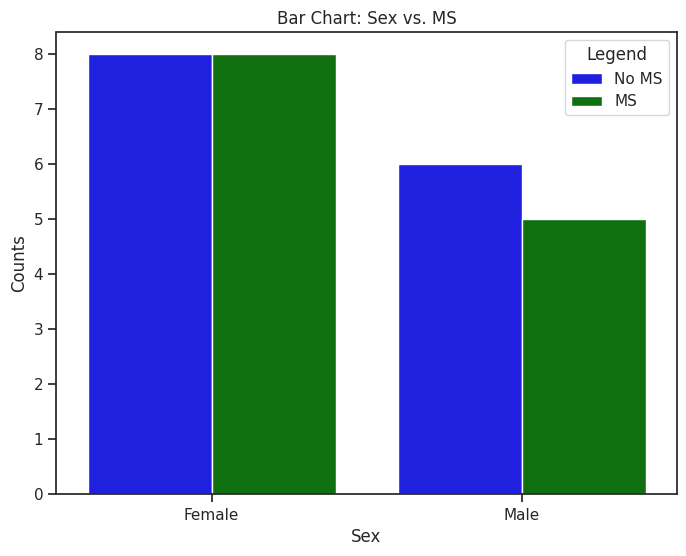

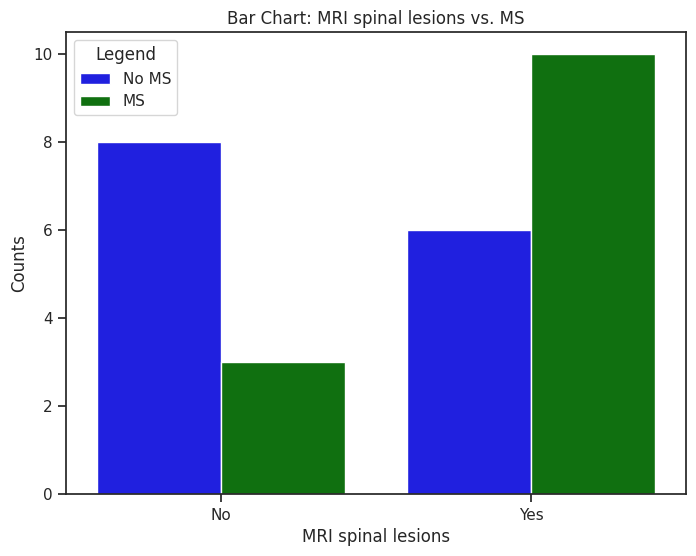

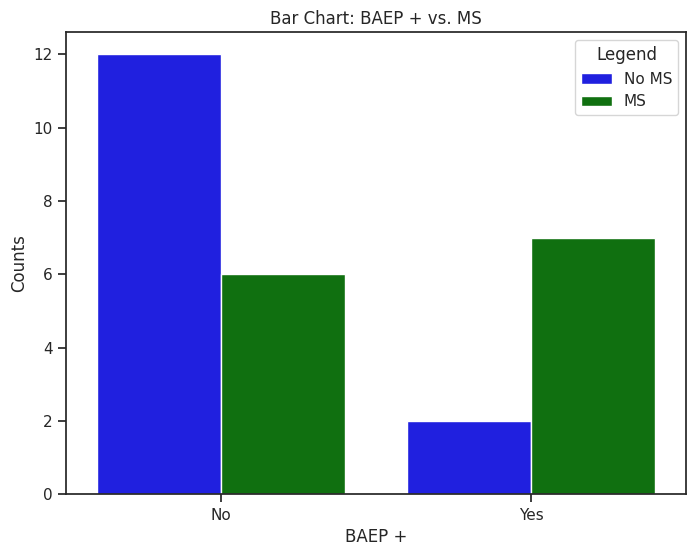

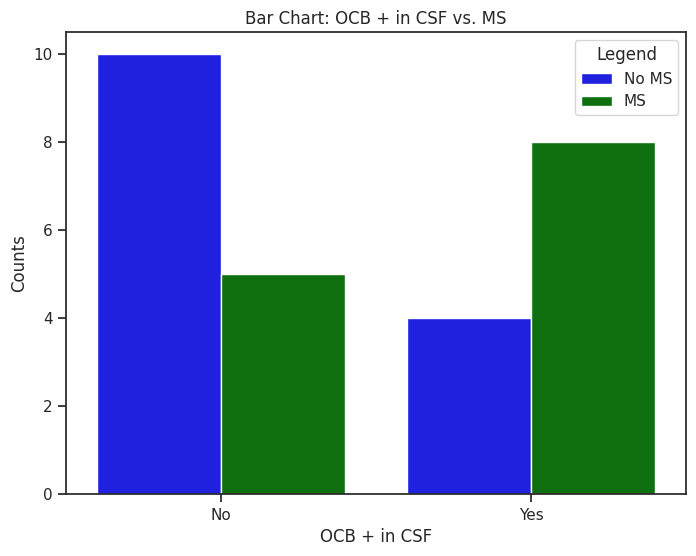

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["blue", "green"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['Sex'] = filtered_df['Sex'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    if variable == 'Sex':
        ax.set_xticklabels(["Female", "Male"])
    else:
        ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()



Visualising correlation and multicollinearity in the train dataset (x) as a correlation matrix, heatmap and Seaborn plots

In [ ]:
# Import libraries
import pandas as pd

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Display the correlation table
corr_table = corr_matrix.style.set_properties(**{'background-color': 'transparent'})

# Display the correlation table
print("Correlation Matrix: ")
corr_table

Correlation Matrix: 


,Sex,BAEP +,MRI spinal lesions,OCB + in CSF,MS
Sex,1.000000,0.060780,0.141574,-0.109466,0.149906
BAEP +,0.060780,1.000000,-0.065796,0.359631,0.354526
MRI spinal lesions,0.141574,-0.065796,1.000000,0.716623,0.597938
OCB + in CSF,-0.109466,0.359631,0.716623,1.000000,0.586713
MS,0.149906,0.354526,0.597938,0.586713,1.000000


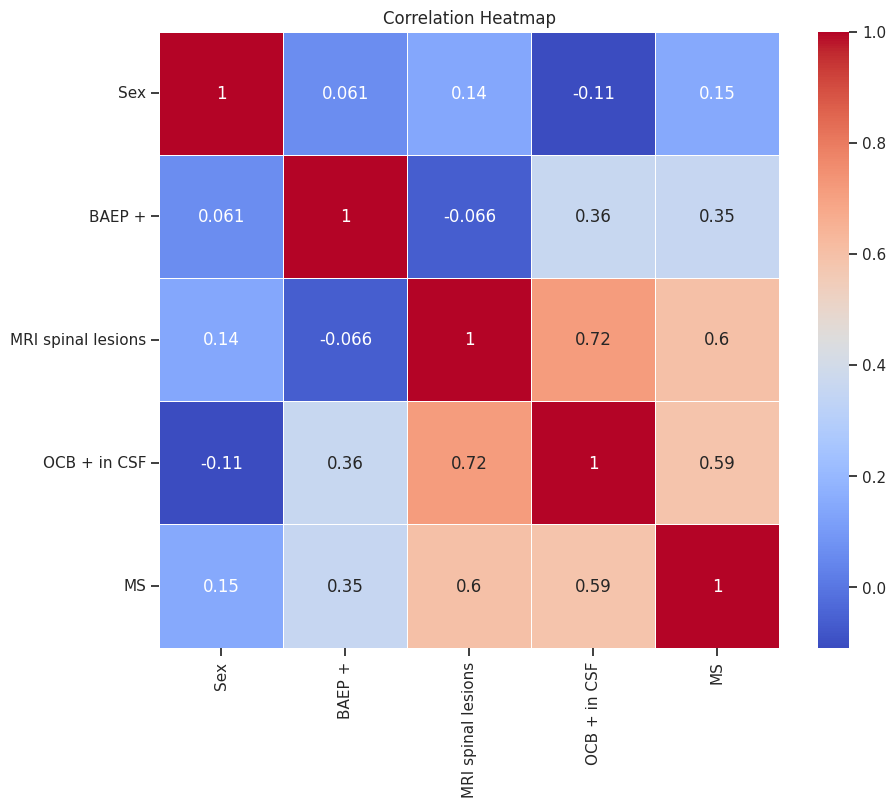

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


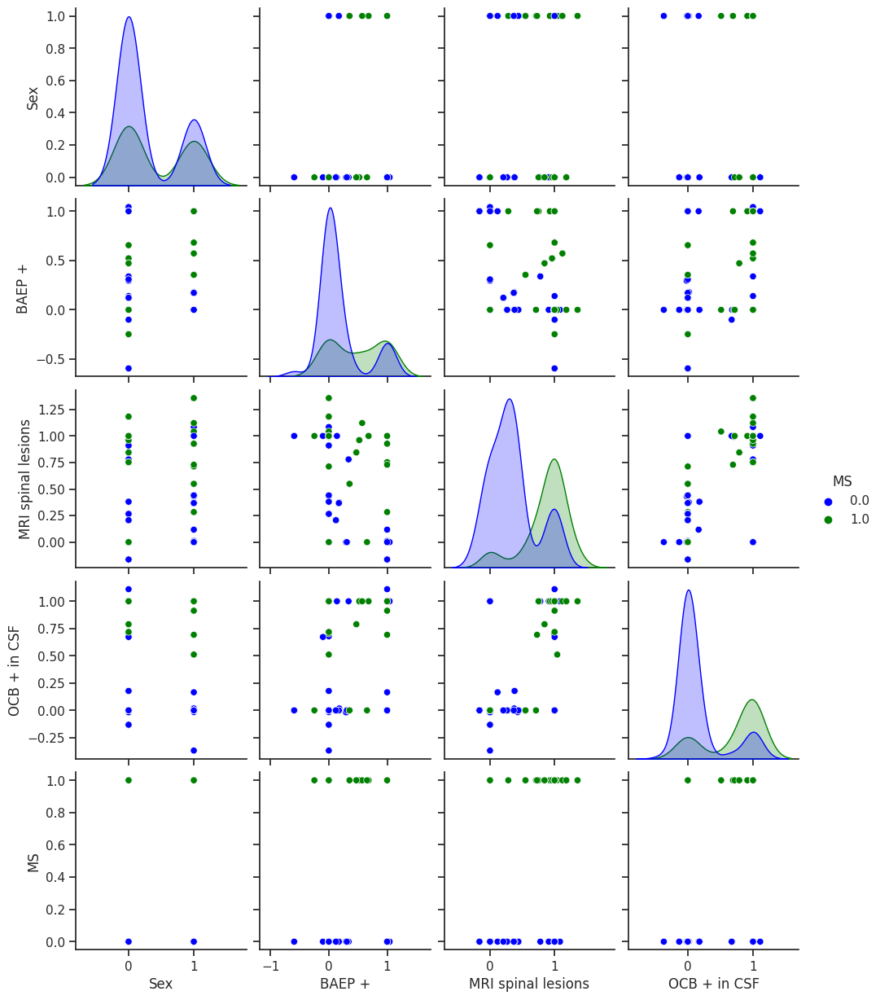

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features and target variable
selected_features = ['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF']
target_variable = 'MS'

# Concatenate the selected features and the target variable
data = imputed_df_train[selected_features + [target_variable]]

# Plot pairwise relationships
sns.pairplot(data, x_vars=selected_features, y_vars=selected_features + [target_variable], hue=target_variable)
plt.show()


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = imputed_df_train[selected_features].corr().abs()

for i in range(len(abs_corr_matrix.columns)):
    for j in range(i + 1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")


Features with multicollinearity (absolute correlation coefficient > 0.7):
MRI spinal lesions - OCB + in CSF


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


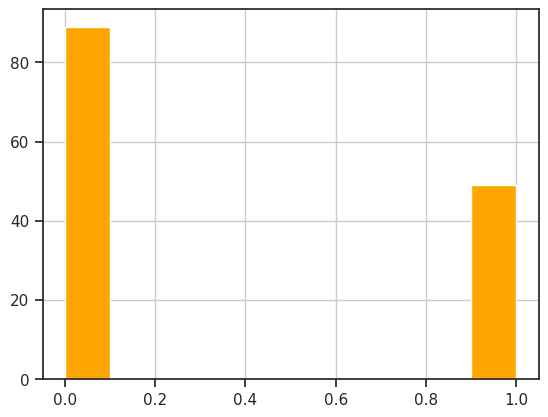

The baseline accuracy is: 0.644927536231884


In [ ]:
# Check if dataset is imbalanced
print(imputed_df_train['MS'].value_counts() * 100.0 / len(imputed_df_train['MS']))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
imputed_df_train['MS'].hist(color='orange')
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

features = imputed_df_train[selected_features]
outcome = imputed_df_train['MS']

clf = DummyClassifier(strategy='most_frequent')
clf.fit(features, outcome)
baseline_accuracy = clf.score(features, outcome)
print("The baseline accuracy is:", baseline_accuracy)


#Data splitting not done as y is a new dataset

##Importing Libraries for Following Steps

In [ ]:
#Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for SVM Classifier
svm_param_grid = {
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],
    'gamma': ['scale', 'auto'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of SVM model
    svm = SVC(random_state=1)

    # Create an instance of GridSearchCV for SVM Classifier
    svm_cv = GridSearchCV(svm, svm_param_grid, cv=svm_skfold)

    # Fit GridSearchCV on the training fold
    svm_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_svm_model = svm_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", svm_cv.best_params_)
    print("F1 Score:", svm_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_svm_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_svm_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'C': 10.0, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'sigmoid', 'random_state': None}
F1 Score: 0.8545454545454545
Best Parameters: {'C': 0.1, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf', 'random_state': None}
F1 Score: 0.8636363636363636
Best Parameters: {'C': 5.0, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.8363636363636363
Best Parameters: {'C': 1.0, 'class_weight': None, 'gamma': 'scale', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.9
Best Parameters: {'C': 5.0, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.8644268774703556


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.8172012012012011
Standard Deviation of Train F1 Score: 0.05076464741764791
Average Validation F1 Score: 0.7803030303030303
Standard Deviation of Validation F1 Score: 0.07357114236214203


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = svm_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = svm_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Import libraries
from sklearn.metrics import classification_report

# Print Classification Report for train dataset (imputed_df_train)
print("Classification Report of Train Data:")
print(classification_report(imputed_df_train['MS'], y_train_pred))

print()

# Print Classification Report for test dataset (imputed_df_test)
print("Classification Report of Test Data:")
print(classification_report(imputed_df_test['MS'], y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.89      0.94      0.92        89
         1.0       0.89      0.80      0.84        49

    accuracy                           0.89       138
   macro avg       0.89      0.87      0.88       138
weighted avg       0.89      0.89      0.89       138


Classification Report of Test Data:
              precision    recall  f1-score   support

         0.0       0.53      0.81      0.64       148
         1.0       0.39      0.15      0.21       124

    accuracy                           0.51       272
   macro avg       0.46      0.48      0.43       272
weighted avg       0.47      0.51      0.45       272



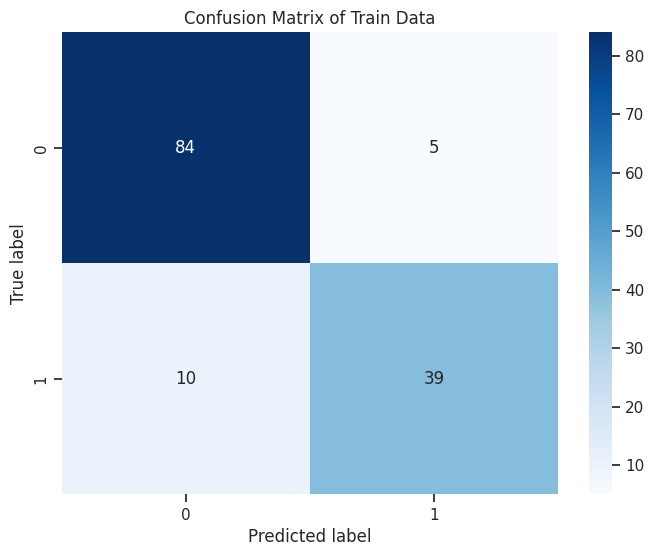

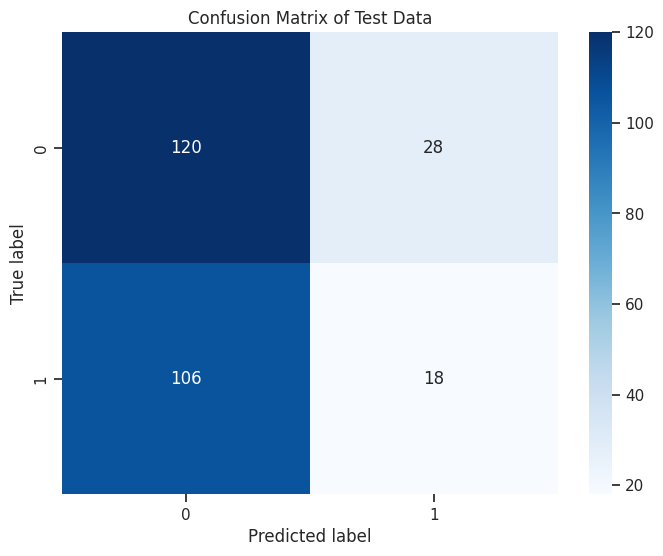

In [ ]:
#Import libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix for train dataset (imputed_df_train)
train_cm = confusion_matrix(imputed_df_train['MS'], y_train_pred)

# Confusion Matrix for test dataset (imputed_df_test)
test_cm = confusion_matrix(imputed_df_test['MS'], y_test_pred)

# Plot Confusion Matrix for train dataset
plt.figure(figsize=(8, 6))
sns.heatmap(train_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Train Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Plot Confusion Matrix for test dataset
plt.figure(figsize=(8, 6))
sns.heatmap(test_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Test Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()



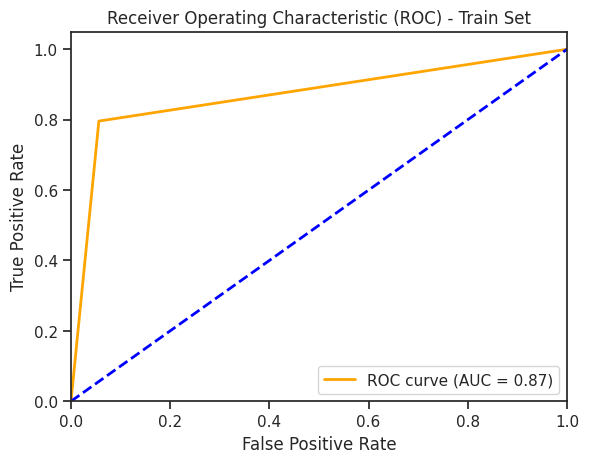

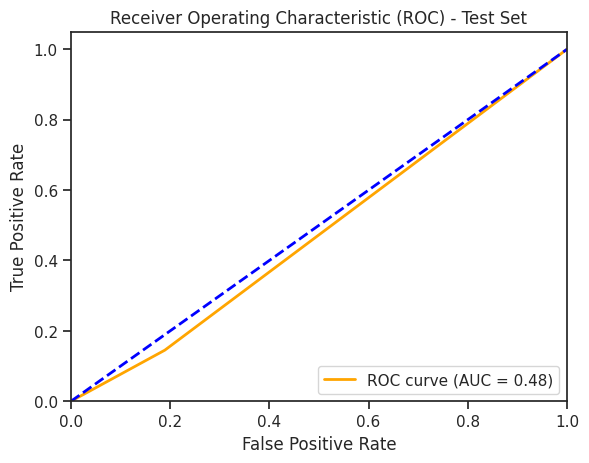

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in imputed_df_train['MS']]
y_test_mapped = [mapping[val] for val in imputed_df_test['MS']]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()


##Calculating Feature Importances

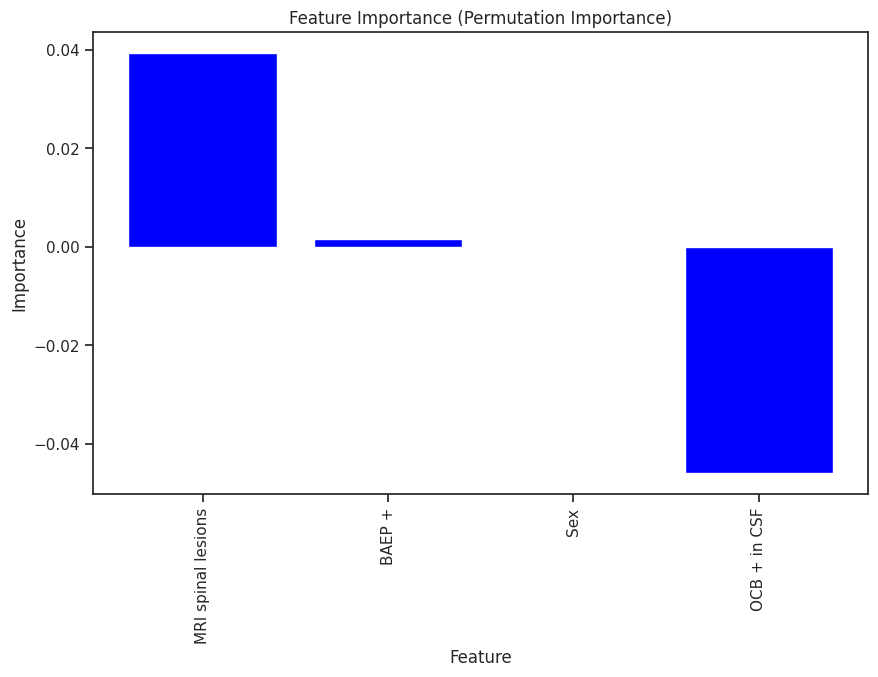

MRI spinal lesions: 0.039338235294117695
BAEP +: 0.001470588235294168
Sex: 0.0
OCB + in CSF: -0.04595588235294114


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Fit the model using the selected features
best_model.fit(imputed_df_train[selected_features], imputed_df_train[target_variable])

# Get feature names from selected_features
feature_names = selected_features

# Compute feature importance using permutation importance
perm_importance = permutation_importance(best_model, imputed_df_test[selected_features], imputed_df_test[target_variable], n_repeats=10, random_state=42)

# Calculate mean importance scores
mean_importance = perm_importance.importances_mean

# Sort features by importance
sorted_indices = np.argsort(mean_importance)[::-1]
sorted_feature_names = [feature_names[idx] for idx in sorted_indices]
sorted_mean_importance = mean_importance[sorted_indices]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(sorted_feature_names, sorted_mean_importance)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance (Permutation Importance)')
plt.show()

# Display importance values
for feature, importance in zip(sorted_feature_names, sorted_mean_importance):
    print(f"{feature}: {importance}")


#6. Testing on Lithuanian Dataset

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file paths and load them into DataFrames
import pandas as pd
train_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Updated Mexican Research Dataset.xlsx')
df_train=pd.DataFrame(train_data)
test_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df_test=pd.DataFrame(test_data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the datasets and their dimensions

In [ ]:
# Visualise the train dataset
df_train.head(400)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0.0,0,0,0,1,0,1
1,2,1,61,1.0,1,0,0,1,0,1
2,3,1,22,1.0,0,0,0,0,0,1
3,4,0,41,1.0,1,0,1,0,0,1
4,5,0,34,0.0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
267,268,0,31,0.0,0,0,0,0,0,0
268,269,1,21,1.0,0,0,0,1,0,0
269,270,0,19,0.0,1,0,0,1,0,0
270,271,0,32,1.0,1,0,1,0,1,0


In [ ]:
# Visualise the test dataset
df_test.head(400)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in both datasets
print("The train dataset dimensions are: ")
print(df_train.shape)
print("The test dataset dimensions are: ")
print(df_test.shape)

The train dataset dimensions are: 
(272, 10)
The test dataset dimensions are: 
(138, 44)


In [ ]:
# Remove unnecessary columns from train dataset
df_train = df_train.drop(['Nr','VEP +', 'Age', 'Periventricular', 'MRI infratentorial lesions'], axis=1)

In [ ]:
# Remove unnecessary columns from test dataset
df_test = df_test.drop(['Nr', 'Fatigue',	'General weakness',	'Pain', 'Age',	'Focal symptoms',	'Cranial Nerve Symptoms','CN3',	'CN4'	,'CN5',	'CN6',	'CN8',	'Pathological reflexes',	"Babinski's",	'Rossolimo',	'Muscle strength',	'Reflex asymmetry',	'Muscle tone abnormalities',	'Proprioception',	'Superficial sensation',	'Coordination',	'Balance',	'Urinary incontinence',	'Urine retention',	'Vertigo',	'Sum of symptoms',	'MRI lesions specific to MS',	'MRI lesions indicative of other diseases',	'Unspecified MRI lesions',	'MRI infratentorial lesions',	'Periventricular',	'Juxtacortical',		'Pathological CSF','Increased protein', 'Increased protein (g/l)',	'Pleocytosis',	'Pleocytosis (cells/ml)',		'IgG levels in CSF',	'VEP +'		], axis=1)


Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df_train = df_train.apply(pd.to_numeric, errors='coerce')
df_test = df_test.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print("Data types of Train Dataset Columns: ")
print(df_train.dtypes)
print()
print("Data types of Test Dataset Columns: ")
print(df_train.dtypes)

Data types of Train Dataset Columns: 
Sex                     int64
OCB + in CSF          float64
BAEP +                  int64
MRI spinal lesions      int64
MS                      int64
dtype: object

Data types of Test Dataset Columns: 
Sex                     int64
OCB + in CSF          float64
BAEP +                  int64
MRI spinal lesions      int64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_train = mice(df_train.values)
imputed_test = mice(df_test.values)

# convert imputed data back to a pandas DataFrame
imputed_df_train = pd.DataFrame(imputed_train, columns=df_train.columns)
imputed_df_test = pd.DataFrame(imputed_test, columns=df_test.columns)

Specify features and target variable

In [ ]:
#Specify x and y in both datasets
x_train =imputed_df_train[['Sex',  'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 1
y_train =imputed_df_train['MS']  # Target variable in Dataset 1

x_test = imputed_df_test[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 2
y_test = imputed_df_test['MS']  # Target variable in Dataset 2


#Print train dimensions
print(x_train.shape)
print(y_train.shape)

#Print test dimensions
print(x_test.shape)
print(y_test.shape)

(272, 4)
(272,)
(138, 4)
(138,)


Visualising Relationship between Target Variable and Each Feature in x

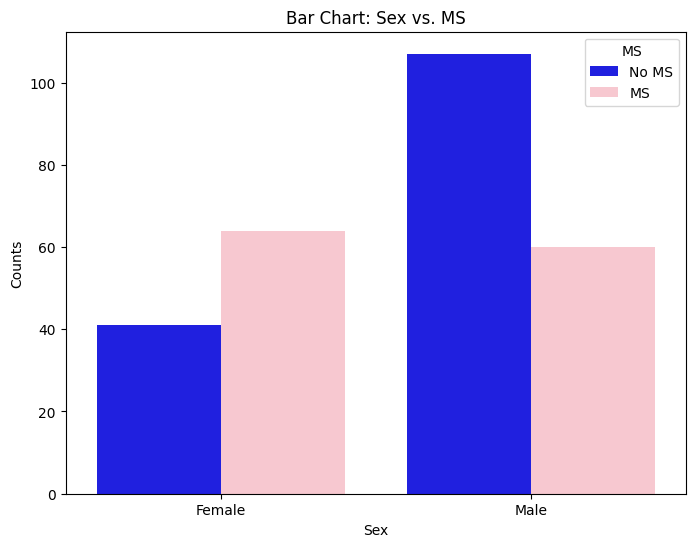

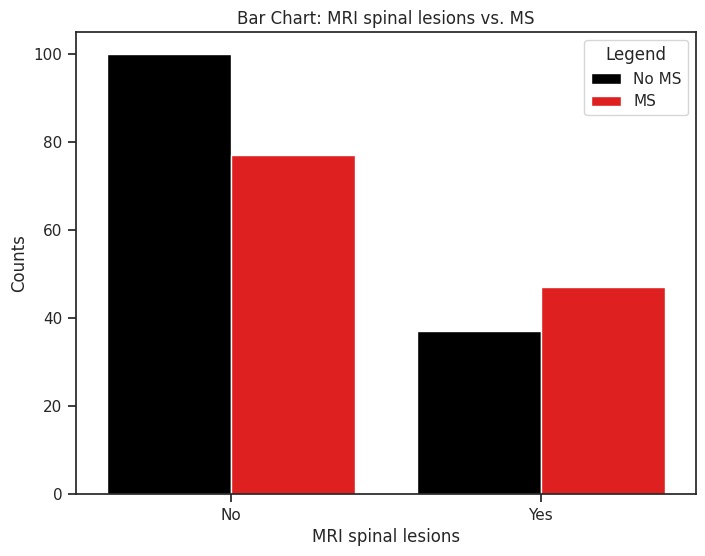

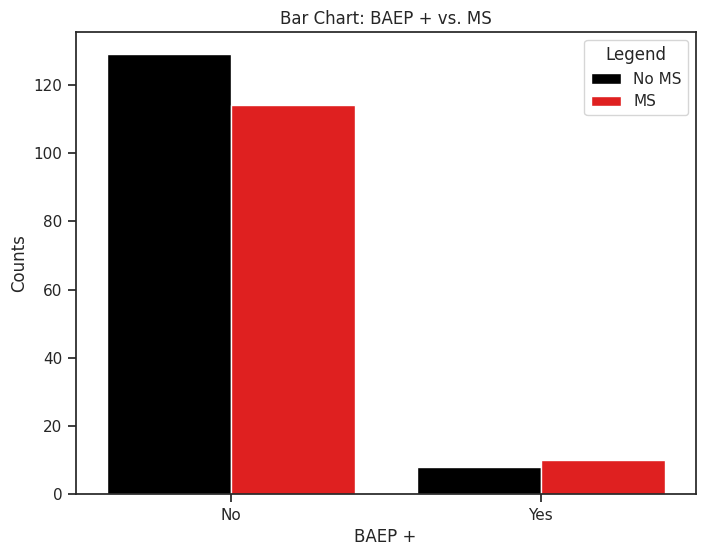

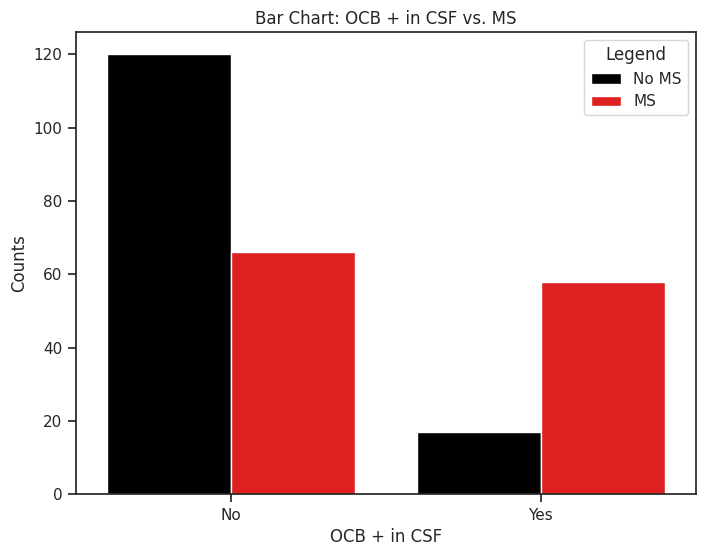

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data
filtered_df = imputed_df_train.copy()
filtered_df = filtered_df.dropna()

# Convert Sex values to strings
filtered_df['Sex'] = filtered_df['Sex'].replace({0.0: 'Female', 1.0: 'Male'})

# Plot bar graph
plt.figure(figsize=(8, 6))
sns.countplot(x='Sex', hue='MS', data=filtered_df, palette={"blue", "pink"})

plt.xlabel("Sex")
plt.ylabel("Counts")
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="MS", labels=["No MS", "MS"])

# Set x-axis tick labels
plt.xticks([0, 1], ["Female", "Male"])

plt.show()

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["black", "red"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()



Visualising correlation and multicollinearity in the train dataset (x) as a correlation matrix, heatmap and Seaborn plots

In [ ]:
# Import libraries
import pandas as pd

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Display the correlation table
corr_table = corr_matrix.style.set_properties(**{'background-color': 'transparent'})

# Display the correlation table
print("Correlation Matrix: ")
corr_table

Correlation Matrix: 


,Sex,Age,BAEP +,MRI spinal lesions,OCB + in CSF,MS
Sex,1.000000,-0.074293,0.153455,-0.003224,0.176901,0.244609
Age,-0.074293,1.000000,0.208582,0.125208,0.066228,0.065317
BAEP +,0.153455,0.208582,1.000000,0.073435,0.164733,0.053275
MRI spinal lesions,-0.003224,0.125208,0.073435,1.000000,0.148313,0.123734
OCB + in CSF,0.176901,0.066228,0.164733,0.148313,1.000000,0.385704
MS,0.244609,0.065317,0.053275,0.123734,0.385704,1.000000


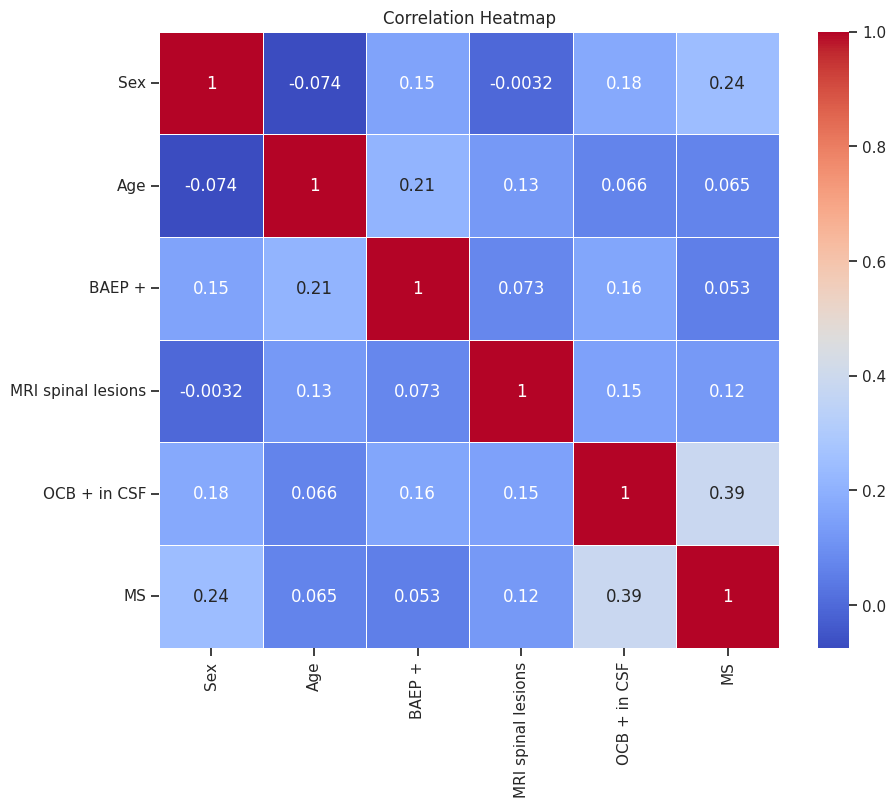

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


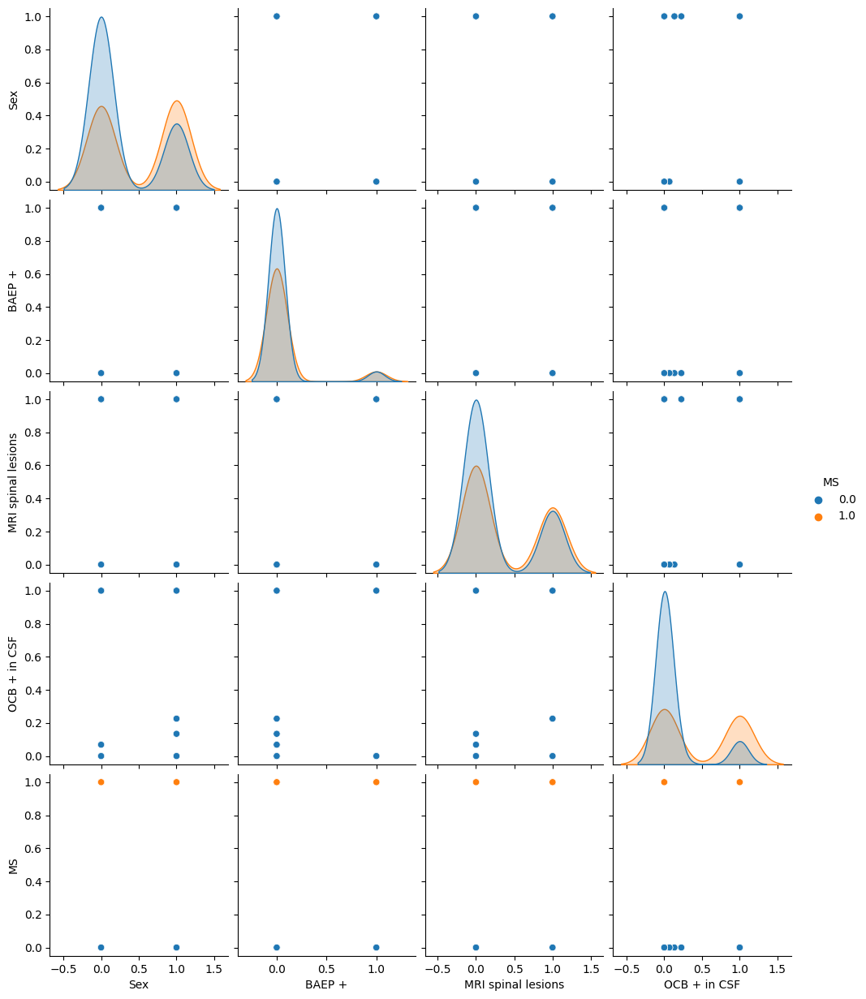

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features and target variable
selected_features = ['Sex',  'BAEP +', 'MRI spinal lesions', 'OCB + in CSF']
target_variable = 'MS'

# Concatenate the selected features and the target variable
data = imputed_df_train[selected_features + [target_variable]]

# Plot pairwise relationships
sns.pairplot(data, x_vars=selected_features, y_vars=selected_features + [target_variable], hue=target_variable)
plt.show()


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = imputed_df_train[selected_features].corr().abs()

for i in range(len(abs_corr_matrix.columns)):
    for j in range(i + 1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")


No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    54.411765
1.0    45.588235
Name: MS, dtype: float64


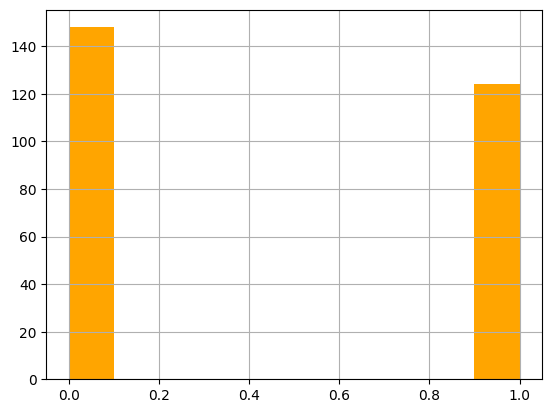

The baseline accuracy is: 0.5441176470588235


In [ ]:
# Check if dataset is imbalanced
print(imputed_df_train['MS'].value_counts() * 100.0 / len(imputed_df_train['MS']))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
imputed_df_train['MS'].hist(color='orange')
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

features = imputed_df_train[selected_features]
outcome = imputed_df_train['MS']

clf = DummyClassifier(strategy='most_frequent')
clf.fit(features, outcome)
baseline_accuracy = clf.score(features, outcome)
print("The baseline accuracy is:", baseline_accuracy)


#Data splitting not done as y is a new dataset

##Importing Libraries for Following Steps

In [ ]:
#Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
# Define parameters to tune for SVM Classifier
svm_param_grid = {
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],
    'gamma': ['scale', 'auto'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of SVM model
    svm = SVC(random_state=1)

    # Create an instance of GridSearchCV for SVM Classifier
    svm_cv = GridSearchCV(svm, svm_param_grid, cv=svm_skfold)

    # Fit GridSearchCV on the training fold
    svm_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_svm_model = svm_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", svm_cv.best_params_)
    print("F1 Score:", svm_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_svm_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_svm_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'C': 10.0, 'class_weight': None, 'gamma': 'auto', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.7047568710359408
Best Parameters: {'C': 10.0, 'class_weight': None, 'gamma': 'auto', 'kernel': 'sigmoid', 'random_state': None}
F1 Score: 0.7234672304439747
Best Parameters: {'C': 5.0, 'class_weight': None, 'gamma': 'scale', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.692600422832981
Best Parameters: {'C': 5.0, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'rbf', 'random_state': None}
F1 Score: 0.6883720930232557
Best Parameters: {'C': 5.0, 'class_weight': None, 'gamma': 'scale', 'kernel': 'poly', 'random_state': None}
F1 Score: 0.7063424947145877


##Average F1 Scores and Standard Deviation:

In [ ]:
from sklearn.metrics import classification_report, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Load the training dataset and assign it to x_train and y_train
x_train = imputed_df_train[[ 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +', 'Sex']]
y_train = imputed_df_train['MS']


# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
test_f1_scores = []

# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

# Iterating over each fold
for train_index, test_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_test_fold = x_train.iloc[train_index], x_train.iloc[test_index]
    y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    # Fitting the model and making predictions for the train set
    svm = SVC()  # Instantiate the SVM model
    svm.fit(x_train_fold, y_train_fold)
    y_train_pred = svm.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the test set
    y_test_pred = svm.predict(x_test_fold)

    # Calculating F1 score for the test set
    test_f1 = f1_score(y_test_fold, y_test_pred)

    # Appending test F1 score to the list
    test_f1_scores.append(test_f1)

# Calculating the average and standard deviation of F1 scores for train and test sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_test_f1 = np.mean(test_f1_scores)
std_test_f1 = np.std(test_f1_scores)

# Print the average and standard deviation for train and test F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Test F1 Score:", avg_test_f1)
print("Standard Deviation of Test F1 Score:", std_test_f1)


Average Train F1 Score: 0.6288337997726122
Standard Deviation of Train F1 Score: 0.01210472917004957
Average Test F1 Score: 0.5982683982683983
Standard Deviation of Test F1 Score: 0.09269630567671822


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on imputed_df_train using the best model
best_model = svm_cv.best_estimator_
y_train_pred = best_model.predict(imputed_df_train[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']])

# Convert y_train_pred to a 2D array with a single feature
y_train_pred = y_train_pred.reshape(-1, 1)

# Make predictions on imputed_df_test using the best model
y_test_pred = best_model.predict(imputed_df_test[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']])

# Convert y_test_pred to a 2D array with a single feature
y_test_pred = y_test_pred.reshape(-1, 1)


##Visualise Various Classification Metrics

In [ ]:
#Import libraries
from sklearn.metrics import classification_report

# Print Classification Report for train dataset (imputed_df_train)
print("Classification Report of Train Data:")
print(classification_report(imputed_df_train['MS'], y_train_pred))

print()

# Print Classification Report for test dataset (imputed_df_test)
print("Classification Report of Test Data:")
print(classification_report(imputed_df_test['MS'], y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.69      0.86      0.77       148
         1.0       0.76      0.55      0.64       124

    accuracy                           0.72       272
   macro avg       0.73      0.70      0.70       272
weighted avg       0.73      0.72      0.71       272


Classification Report of Test Data:
              precision    recall  f1-score   support

         0.0       0.70      0.79      0.74        89
         1.0       0.50      0.39      0.44        49

    accuracy                           0.64       138
   macro avg       0.60      0.59      0.59       138
weighted avg       0.63      0.64      0.63       138



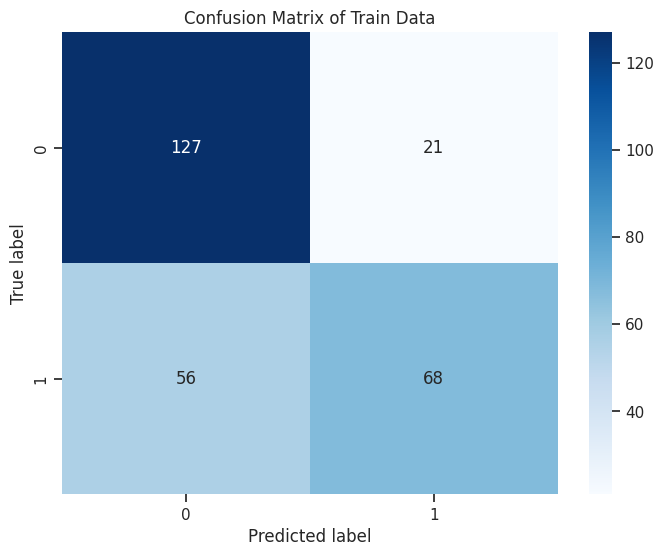

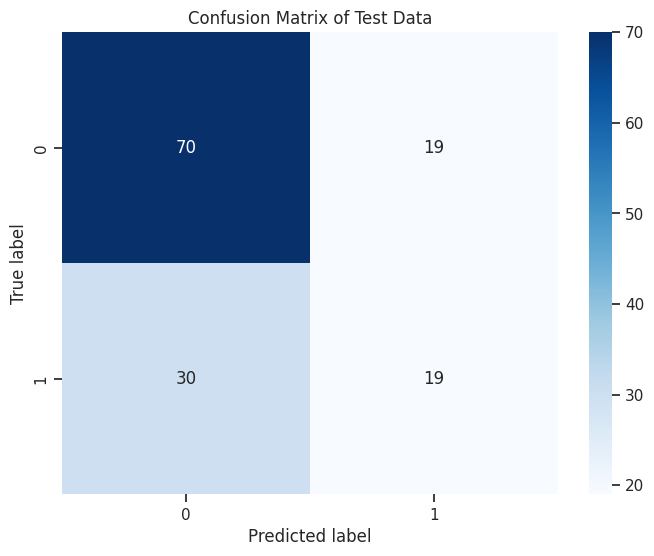

In [ ]:
#Import libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix for train dataset (imputed_df_train)
train_cm = confusion_matrix(imputed_df_train['MS'], y_train_pred)

# Confusion Matrix for test dataset (imputed_df_test)
test_cm = confusion_matrix(imputed_df_test['MS'], y_test_pred)

# Plot Confusion Matrix for train dataset
plt.figure(figsize=(8, 6))
sns.heatmap(train_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Train Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Plot Confusion Matrix for test dataset
plt.figure(figsize=(8, 6))
sns.heatmap(test_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Test Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()



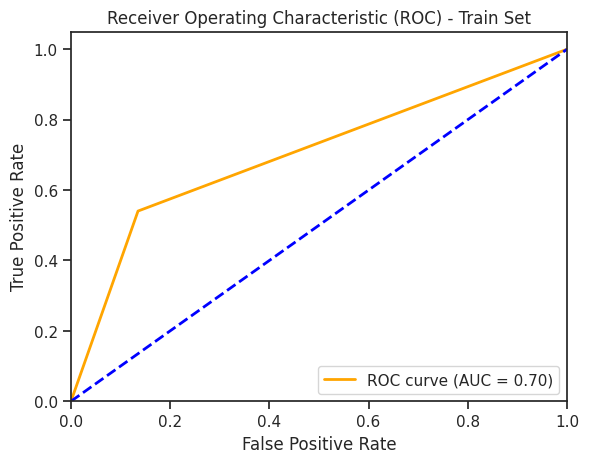

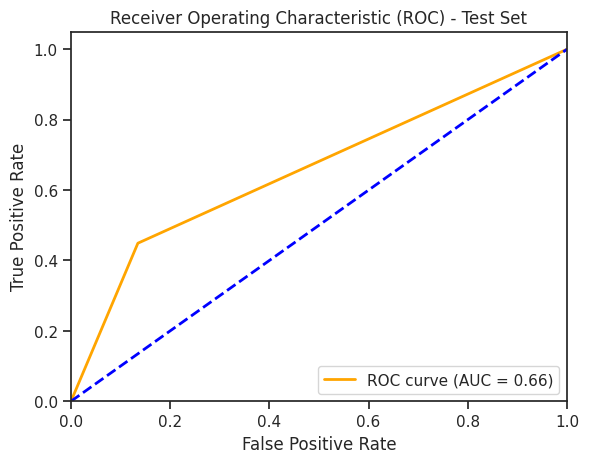

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Fit the model using best_model instead of svm_cv.best_estimator_
best_model = svm_cv.best_estimator_
best_model.fit(x_train, y_train)

# Make predictions on the train and test sets using the best model
y_train_pred = best_model.predict(x_train)
y_test_pred = best_model.predict(x_test)

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()


##Calculate Feature Importance Scores

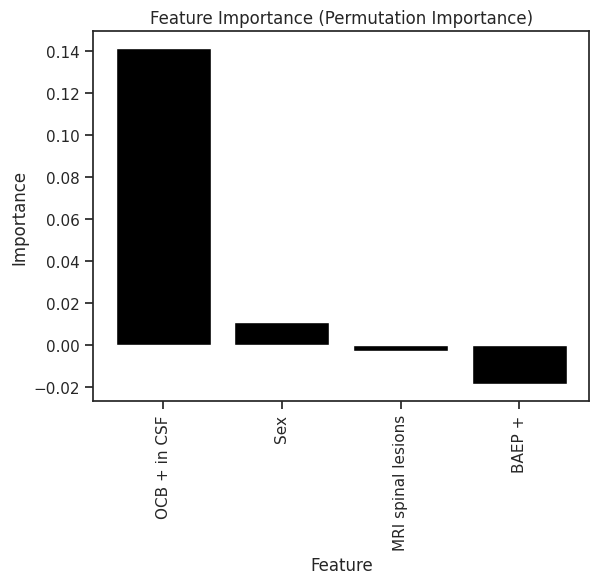

In [ ]:
#Import libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Compute feature importance using permutation importance
perm_importance = permutation_importance(best_model, x_test, y_test, n_repeats=10, random_state=42)

# Get feature names
feature_names = list(x_train.columns)

# Calculate mean importance scores
mean_importance = perm_importance.importances_mean

# Sort features by importance
sorted_indices = np.argsort(mean_importance)[::-1]
sorted_feature_names = [feature_names[idx] for idx in sorted_indices]
sorted_mean_importance = mean_importance[sorted_indices]

# Plot feature importances
plt.bar(sorted_feature_names, sorted_mean_importance)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance (Permutation Importance)')
plt.show()

#7. Using Concatenated Dataset (Mexican+Lithuanian Combined)

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Concatenated Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0,0.0,0.0,0.0,1.0,0.0,1
1,2,1,61,1,1.0,0.0,0.0,1.0,0.0,1
2,3,1,22,1,0.0,0.0,0.0,0.0,0.0,1
3,4,0,41,1,1.0,0.0,1.0,0.0,0.0,1
4,5,0,34,0,0.0,0.0,1.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...
135,136,0,37,0,0.0,0.0,1.0,0.0,0.0,0
136,137,0,52,0,0.0,0.0,0.0,1.0,0.0,0
137,138,0,48,0,1.0,1.0,1.0,0.0,0.0,0
138,139,0,25,1,1.0,0.0,1.0,1.0,0.0,0


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(410, 10)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                             int64
Age                             int64
OCB + in CSF                  float64
VEP +                         float64
BAEP +                        float64
Periventricular               float64
MRI spinal lesions            float64
MRI infratentorial lesions    float64
MS                              int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[['Age', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +', 'Sex']]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(410, 5)
(410,)


Visualising Relationship between Target Variable and Each Feature in X

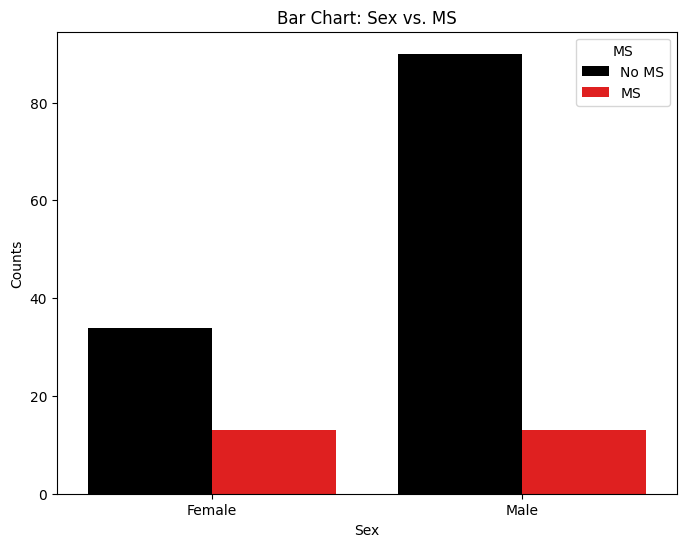

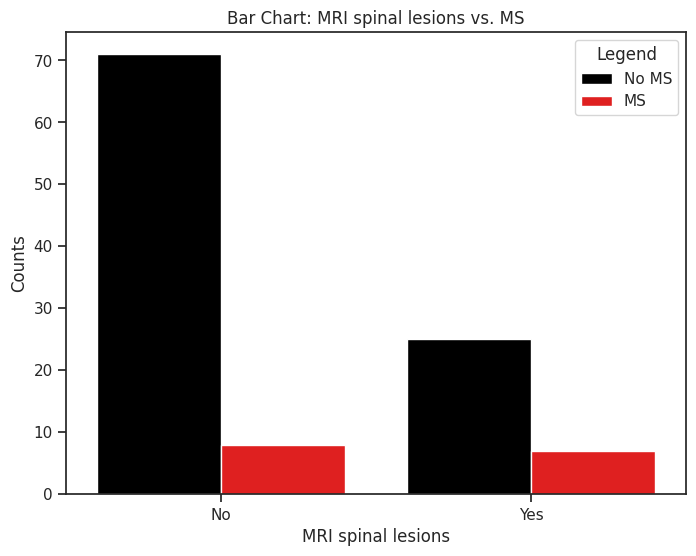

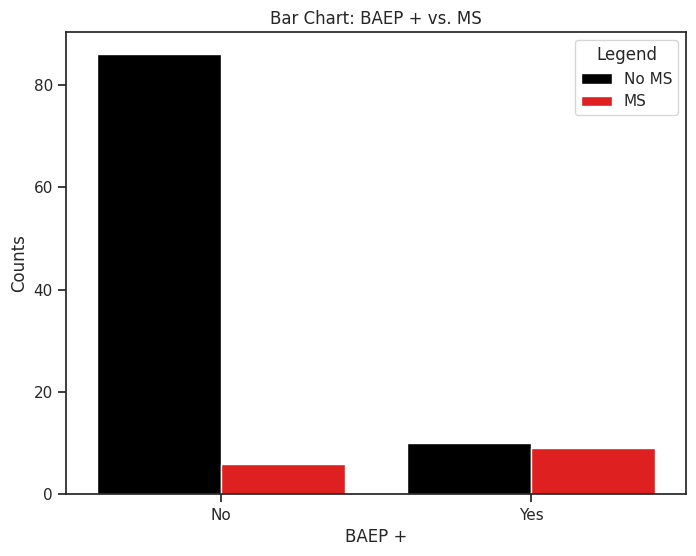

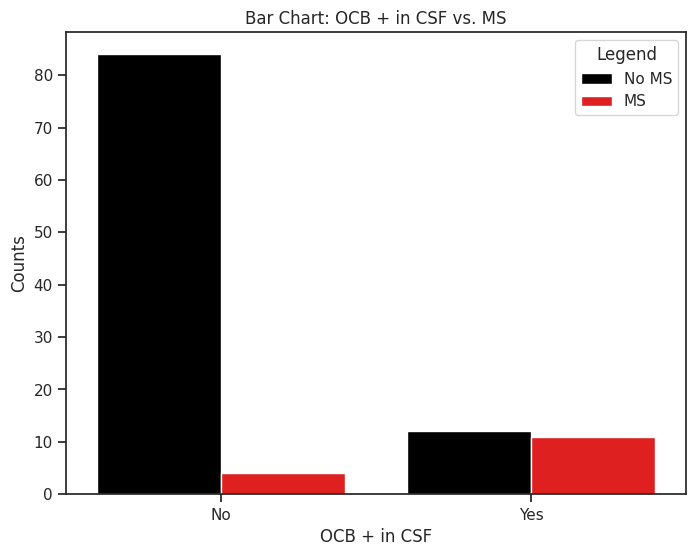

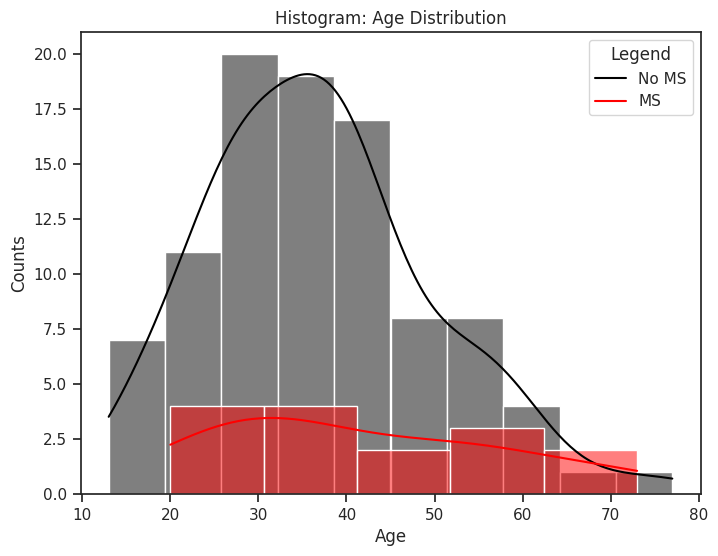

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data
filtered_df = imputed_df.copy()
filtered_df = filtered_df.dropna()

# Convert Sex values to strings
filtered_df['Sex'] = filtered_df['Sex'].replace({0.0: 'Female', 1.0: 'Male'})

# Plot bar graph
plt.figure(figsize=(8, 6))
sns.countplot(x='Sex', hue='MS', data=filtered_df, palette={"black", "red"})

plt.xlabel("Sex")
plt.ylabel("Counts")
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="MS", labels=["No MS", "MS"])

# Set x-axis tick labels
plt.xticks([0, 1], ["Female", "Male"])

plt.show()

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["black", "red"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df.copy()
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()

# Create separate histograms for 'No MS' and 'MS' labels
plt.figure(figsize=(8, 6))
sns.histplot(filtered_df[filtered_df['MS'] == 0]['Age'], color='black', label='No MS', kde=True)
sns.histplot(filtered_df[filtered_df['MS'] == 1]['Age'], color='red', label='MS', kde=True)

plt.xlabel("Age")
plt.ylabel("Counts")
plt.title("Histogram: Age Distribution")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,Age,MRI spinal lesions,OCB + in CSF,BAEP +,Sex,MS
Age,1.000000,0.162507,-0.002457,0.270298,-0.032760,0.105416
MRI spinal lesions,0.162507,1.000000,0.177487,0.051903,0.099100,0.108796
OCB + in CSF,-0.002457,0.177487,1.000000,0.364243,0.049359,0.523006
BAEP +,0.270298,0.051903,0.364243,1.000000,0.104055,0.424818
Sex,-0.032760,0.099100,0.049359,0.104055,1.000000,0.184275
MS,0.105416,0.108796,0.523006,0.424818,0.184275,1.000000


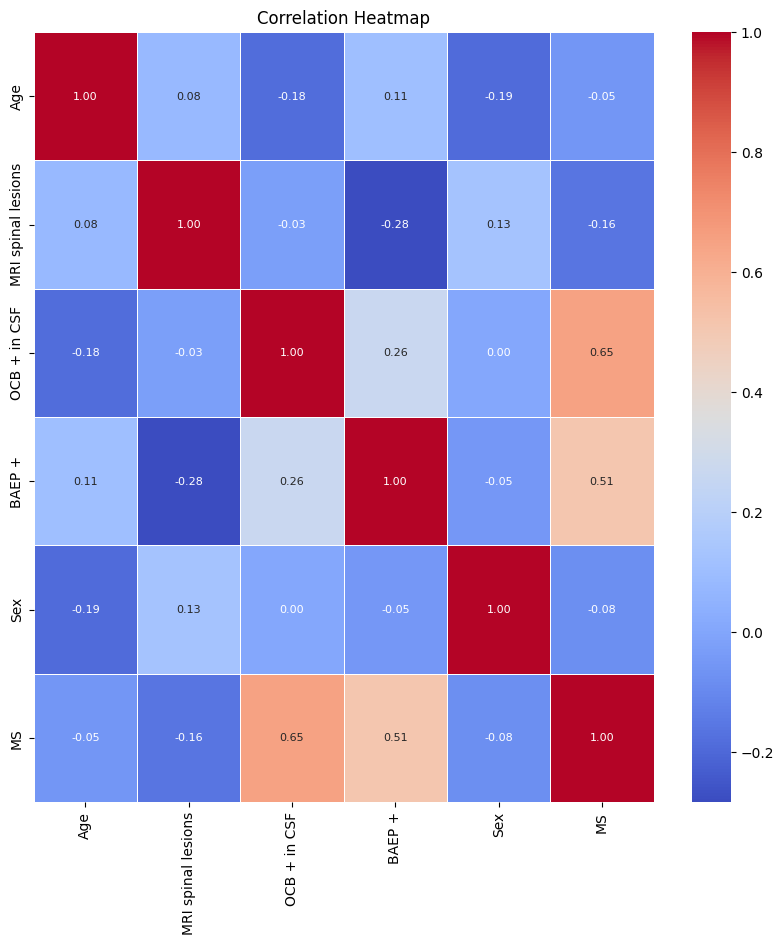

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

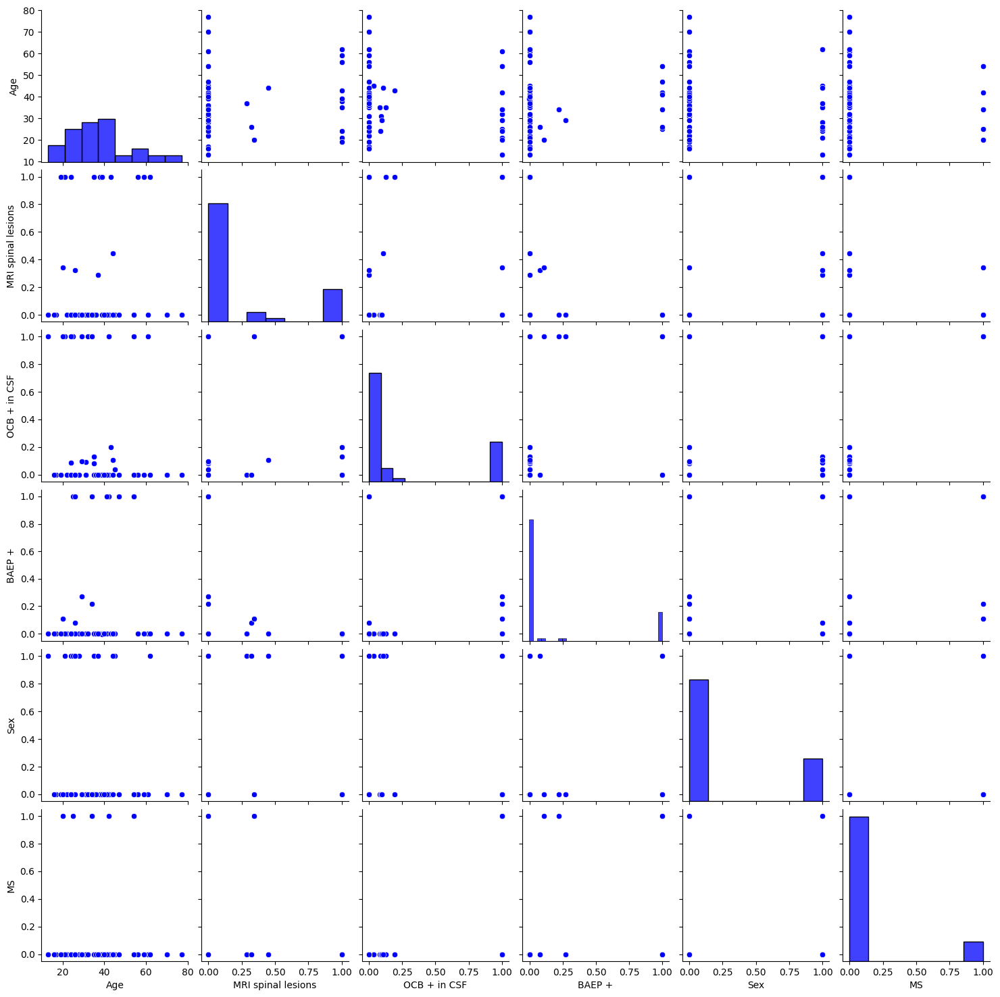

In [ ]:
# Import library
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(data, diag_kws={'color': color}, plot_kws={'color': color})


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    57.804878
1.0    42.195122
Name: MS, dtype: float64


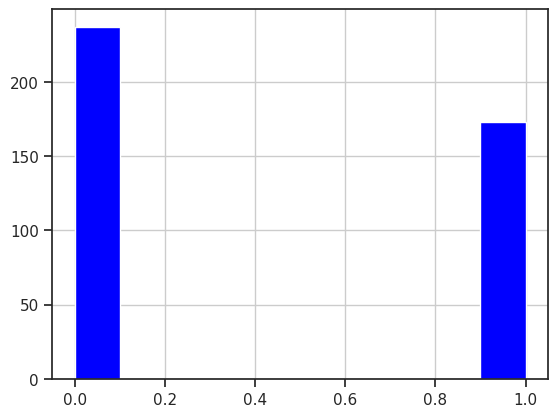

The baseline accuracy is: 0.5780487804878048


In [ ]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualize dataset imbalance
import matplotlib.pyplot as plt
y.hist(color=['blue'])
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (328, 5)
x_test: (82, 5)
y_train: (328,)
y_test: (82,)


In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [ ]:
# Define parameters to tune for SVM Classifier
svm_param_grid = {
    'C': [0.1, 0.5, 1.0, 5.0, 10.0],
    'kernel': ['linear', 'rbf', 'sigmoid','poly'],
    'gamma': ['scale', 'auto'],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


In [ ]:
# Creating an instance of StratifiedKFold
svm_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in svm_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of SVM model
    svm = SVC(random_state=1)

    # Create an instance of GridSearchCV for SVM Classifier
    svm_cv = GridSearchCV(svm, svm_param_grid, cv=svm_skfold)

    # Fit GridSearchCV on the training fold
    svm_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_svm_model = svm_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", svm_cv.best_params_)
    print("F1 Score:", svm_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_svm_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_svm_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


In [ ]:
# Make predictions on the train set using best model
best_model = svm_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = svm_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

In [ ]:
#Import libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Compute feature importance using permutation importance
perm_importance = permutation_importance(best_model, x_test, y_test, n_repeats=10, random_state=42)

# Get feature names
feature_names = list(x_train.columns)

# Calculate mean importance scores
mean_importance = perm_importance.importances_mean

# Sort features by importance
sorted_indices = np.argsort(mean_importance)[::-1]
sorted_feature_names = [feature_names[idx] for idx in sorted_indices]
sorted_mean_importance = mean_importance[sorted_indices]

# Plot feature importances
plt.bar(sorted_feature_names, sorted_mean_importance)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance (Permutation Importance)')
plt.show()
